# Appendix - Time Series Analysis in R

Time is an indelible part of biology: living organisms and populations are constantly in a state of flux.

As biologists, we are often interested in characterising these changes over time, and predicting what will happen in the future - whether it be the levels of a particular molecule in a cell over several days or the number of organisms caught in a trap over several years.

A set of observations of a variable repeated over time points is typically called a "time series", and there are specific methods (collectively called, you guessed it, "time series analysis") that have been developed to characterise them. These methods are necessary because time series violate the basic assumptions underlying traditional statistical techniques like linear models. 

This tutorial will introduce you to what time series are, what makes them so unique, and some of the standard methods used to analyse them.

## What is a time series?

In essence, a time series is any dataset where repeated observations are made over time at regular intervals.

Time has an arrow: it only moves forward, and—within a chosen frame of reference—it flows at a constant rate of one second per second (setting aside the small rate changes predicted by Einstein's special relativity!).

Given this unidirectionality, we can say that effects at time $t$ cannot be affected by conditions at time $t+1$. Events in a time series can only be _dependent_ on conditions that have happened previously (or are happening "now").

### The "problem" with time series

From a statistical perspective, the biggest problem with time series data is that time-dependent variables are not "independent and identically distributed (i.i.d.)", a common requirement for classical statistical approaches.

This is because if one data point depends on a previous data point, it _cannot_ be independent. As such, we require a different set of approaches that take this into account. Hence: _time series analysis_.

### Examples of time series

<img src="https://yanshuo.quarto.pub/nus-ts-book/01-intro_files/figure-html/fig-intro-globtemp-1.png" width=800>

Time series data appear across a wide range of different fields:

- Climate data in environmental science
- Disease incidence in epidemiology
- Population abundances in ecology
- and many _many_ more

### A note on time series

Not all datasets with a time component are inherently time series, data with irregularly-spaced sampling points may not be suitable for time series analysis without further aggregation.

## What is the purpose of time series analysis?

Fundamentally, like with any data analysis, time series analysis looks to extract some sort signal from data. Some goals may be as follows:

### Forecasting

Sometimes you want to know what may happen next given a previous time series, this is called "forecasting", a term you may be familiar with from meterology.

A weather forecast aims to predict weather patterns from previous data and the current conditions. If it was hot yesterday, it may well be hot today (or we may get a major rainstorm!)

Alternatively, epidemiologists may be interested in the progression of disease incidence in a population, and may be actively monitoring an outbreak. Time series analysis can be a useful tool in this process.

### Smoothing, filtering, and cleaning

Time series data are often noisy and hard to see direct signals within. Smoothing and filtering can be useful to extract the "signal" from the surrounding "noise".

### Trending and regression

Often one may be interested in the relationship between different variables, accounting for the effect of time.

This is where time series regression can allow us to both consider how the dependent variable changes over time, and also elucidate the effect of any independent variables of interest.

For instance we may wish to understand the effect of urbanisation on the population dynamics of mosquitoes. Time series regression may allow us to seperate human effects from the typical seasonal cycles of mosquito population.

## Getting started in R

Before we go any further it is advisable to install the packages required for this workshop `fpp3`, `astsa`, `tidyverse` & `GGally`. `fp33` actually installs a bunch of other useful packages such as `tsibble`, `feasts` & `fable`.

In [ ]:
install.packages(tidyverse)
install.packages(fpp3)
install.packages(astsa)
install.packages(GGally)
install.packages(devtools)

It will also be worthwhile installing the hub's own `ohvbd` package:

In [ ]:
devtools::install_github("fwimp/ohvbd", build_vignettes = TRUE)

If you do not have much time, you can install the package without building the vignettes locally, using:

In [ ]:
devtools::install_github("fwimp/ohvbd")

The documentation for ohvbd as a whole can be found [here](https://fwimp.github.io/ohvbd/)

Once you have installed these (it may take a while if you have not previously installed tidyverse in particular), it's time to load the fpp3 and ohvbd packages:

In [ ]:
suppressWarnings(suppressPackageStartupMessages(library(fpp3)))
suppressWarnings(suppressPackageStartupMessages(library(ohvbd)))

This loads a bunch of other packages such as some `tidyverse` packages, and a few others such as `tsibble` and `fable`.

These last two packages are time-series-specific packages that aid in the processing of time-series data.

If you are running on Linux (or potentially on MacOS), you will also need to run the following command to set up `ohvbd` to properly pull from some databases:

In [ ]:
set_ohvbd_compat()

✔ Set compatibility mode = TRUE



If you want to know what this does and why it is needed, feel free to ask me for details.

Now I just need to set up some internal things for this notebook. Ignore the following code:

In [ ]:
# Just for prettier markdown here, you don't need to do this
options(repr.matrix.max.rows=10)
options(repr.plot.width=16, repr.plot.height=10)
theme_set(theme_gray(base_size = 18))

### The `tsibble`

`tsibble` is the time-series equivalent of a `tibble`, a common data structure for holding general tabular data. `tsibble` contains extra metadata to define the time series completely, a few of which are different from a standard `tibble`.

The `key` is a variable that uniquely defines a given sub-series within a full time series.

The `index` defines the time point at which an individual measurement is taken. This should be a column that is already in some sort of time/date format.

So as a very simple example, imagine we have performed tick drags every day for the month of May 2024 in three different sites. Our data may look something like this:

In [ ]:
ticktest <- tsibble(
  date = rep(as_date("2024-05-01") + 0:30, 3),
  value = c(rpois(31,20), rpois(31,10), rpois(31,50)),
  group = c(rep("Silwood Bottom", 31), rep("Water Meadow", 31), rep("Rookery Slope", 31)),
  key = group,
  index = date
  )
ticktest

date,value,group
<date>,<int>,<chr>
2024-05-01,50,Rookery Slope
2024-05-02,53,Rookery Slope
2024-05-03,60,Rookery Slope
2024-05-04,41,Rookery Slope
2024-05-05,54,Rookery Slope
⋮,⋮,⋮
2024-05-27,10,Water Meadow
2024-05-28,8,Water Meadow
2024-05-29,13,Water Meadow


In [ ]:
tsibble::interval(ticktest)

<interval[1]>
[1] 1D

Using `tsibble` structures makes basic time series analysis much easier (as it plays well with other time series packages), however it is not entirely necessary to convert to `tsibble` in all scenarios. Your decision will likely depend on your usecase.

When you print a `tsibble` object, generally the output will start with a few descriptive lines that are worthwhile knowing how to interpret.

In the following example, this `tsibble` is a 93 line dataset, with a period (time between observations) of 1 day (`[1D]`) and 3 groups.

## Plotting

Plotting a time series in a `tsibble` is made exceptionally easy using the `autoplot()` function originally from `ggplot2`. If you feed a `tsibble` object into `autoplot()` using a pipe (`|>`) then it will try its best to plot the time series in a sensible manner:


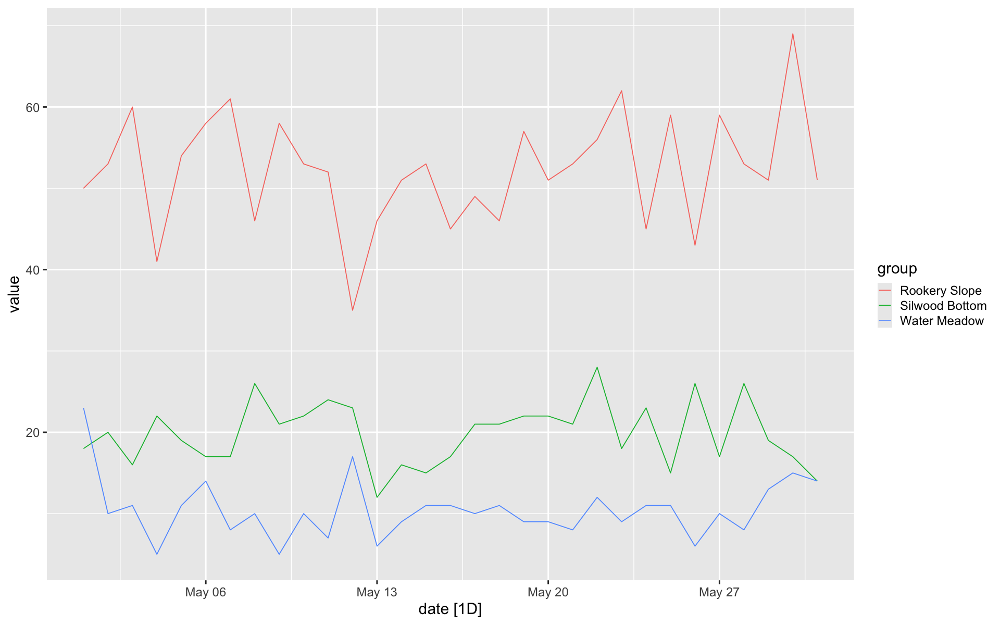

In [ ]:
ticktest |> autoplot(.vars=value)

If you do not provide the name of a column to the `.vars` argument, it does try to work out the most sensible column, but will also throw a warning when it does. As such it's usually best to include this argument.

Now this data was just randomly generated with no real signal, however we can just use real data to see some more usable time series

## Dealing with missing values

Some time series data has missing values that can really get in the way of proper modelling. For an example let's look at some data in `vecdyn`.

In [ ]:
df <- ohvbd.ids(526, db = "vd") |> # Decide what data we want to pull, and from where
  fetch() |> # Fetch the data from vecdyn
  extract(cols = c("location_description", "sample_value", "sample_start_date")) |> # Extract the columns we want from the responses
  mutate(
    sample_start_date = as_date(sample_start_date),
    sample_value = as.numeric(sample_value)
    ) # Wrangle the columns into appropriate data formats

ℹ Found 249 rows of data.

ℹ Predicted to take ~2s.



Now if we try to convert this week-interval data to a tsibble straight-out we will encounter a problem:

In [ ]:
df |> tsibble()

Using `sample_start_date` as index variable.


location_description,sample_value,sample_start_date
<chr>,<dbl>,<date>
Alps,0,2010-05-28
Alps,0,2010-06-04
Alps,0,2010-06-11
Alps,0,2010-06-18
Alps,0,2010-06-25
⋮,⋮,⋮
Alps,17.855340,2019-10-06
Alps,0.000000,2019-10-13
Alps,3.032694,2019-10-20


In [ ]:
df |> tsibble() |> tsibble::interval()

Using `sample_start_date` as index variable.


<interval[1]>
[1] 1D

The `# A tsibble: 249 x 3 [1D]` line here shows that tsibble has decided this is a dataset taken at 1-day intervals.

Remember a time series must have equally spaced intervals, so in the case where there are varying intervals, it will take the lowest common denominator. In this case that is simply daily data.

However these data are weekly egg data, taken just before the mosquito season in Italy starts, and continuing until no more mosquito eggs are found in the ovitraps.

To deal with this we need to do some slightly messy wrangling. Let's first replace all the missing values in our time series.

Luckily we know (using our own ecological intuition) that any time out of season, the mosquito population will be essentially 0, so we can replace any missing values with 0s.

In [ ]:
dfibble <- df |> 
  tsibble(key = location_description, index = sample_start_date) |> # Convert to tsibble
  arrange(sample_start_date) |> # Arrange by start date
  fill_gaps(sample_value = 0) # Fill missing values with 0s (as it's out of mosquito season)
dfibble

location_description,sample_value,sample_start_date
<chr>,<dbl>,<date>
Alps,0,2010-05-28
Alps,0,2010-05-29
Alps,0,2010-05-30
Alps,0,2010-05-31
Alps,0,2010-06-01
⋮,⋮,⋮
Alps,0,2019-11-15
Alps,0,2019-11-16
Alps,0,2019-11-17


This still isn't right though. We now have days within the mosquito season getting filled with 0s.

We can see that by just getting the data from 2019.

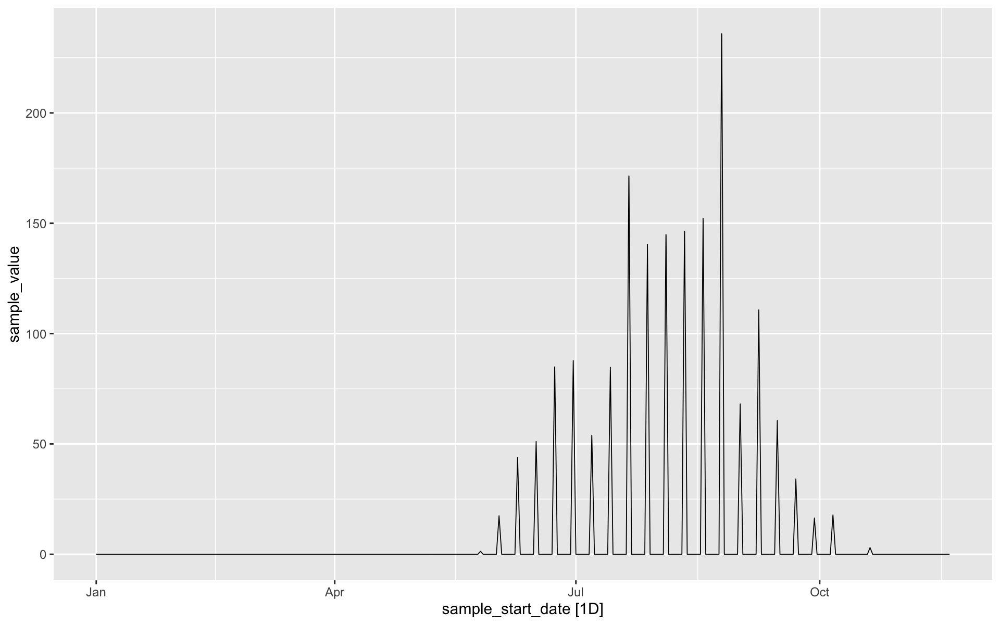

In [ ]:
dfibble |> filter(year(sample_start_date) == 2019) |> autoplot(.vars = sample_value)

It appears as though the sample value keeps dropping to zero within the season.

This is because the original data was sampled once per week! We must then reaggregate the dataset to a weekly scale.

This sort of thing is a fairly common occurrence within time series analysis, especially when your data are not nicely-behaved toy datasets.

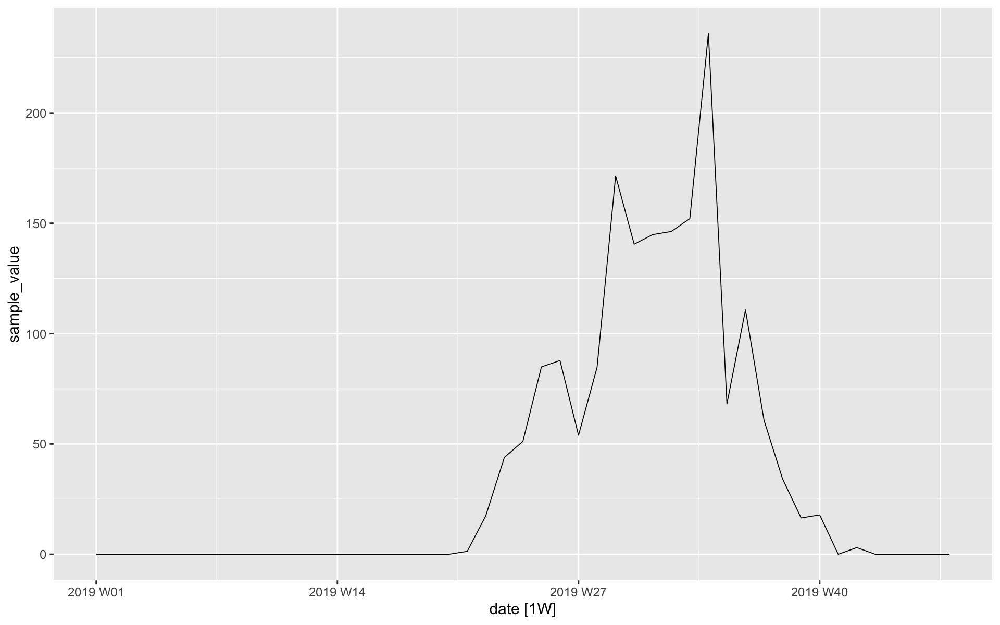

In [ ]:
dfibble <- dfibble |> 
  index_by(date = ~ yearweek(.)) |> # Aggregate to week-level (as original data is week-level)
  summarise(sample_value = max(sample_value)) # Find the max value (as there is only a maximum of 1 value per week that is non-0)

dfibble |> filter(year(date) == 2019) |>  autoplot(.vars = sample_value)

That looks much better, and now we have a fully-functional time series:

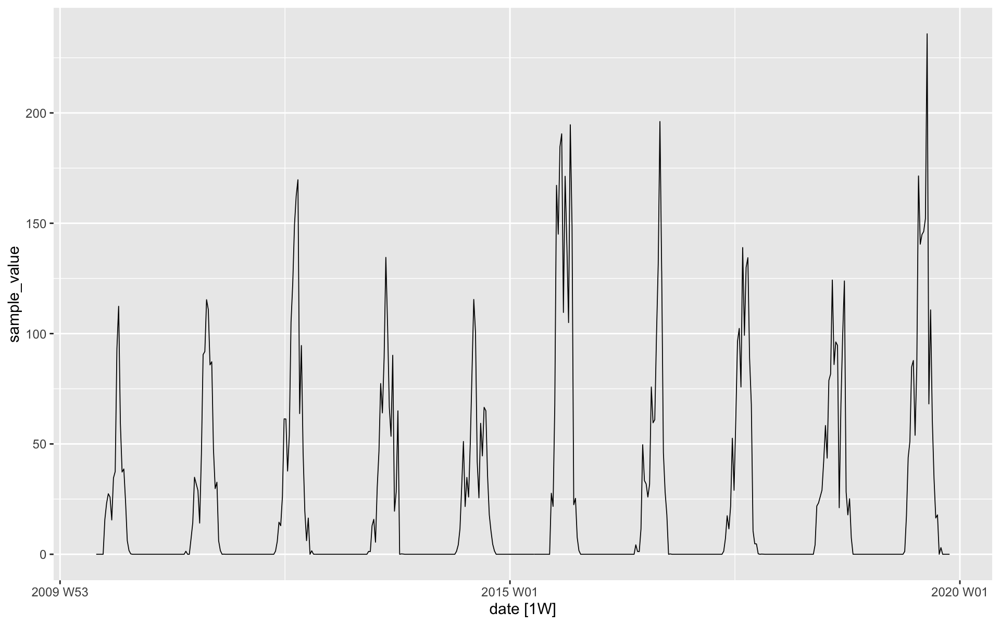

In [ ]:
dfibble |> autoplot(.vars = sample_value)

> **Beware**, you cannot always just assume that any missing values are 0s. This is a decision you can only make by _actually understanding your data_.

There is actually a whole area of statistics related to imputation (filling in gaps) in time series data. We're not going to cover this here as we are dealing with relatively "kind" datasets, but if you are interested in the deep dynamical models used to do this, a good place to start would be to look at the [Kalman filter](https://en.wikipedia.org/wiki/Kalman_filter) which can be combined with ARIMA models to impute missing data.

Generally speaking the easiest way to deal with missing data, though, is with aggregation.

## Seasonality plots

Given that each year has different distinct seasons, and each season is similar between years, another way to look at time series data across years is using something called a seasonality plot. This overlays the years on top of one another and allows us to easily compare data between the years.

We can do that using the `gg_season()` function, defined in `feasts`:

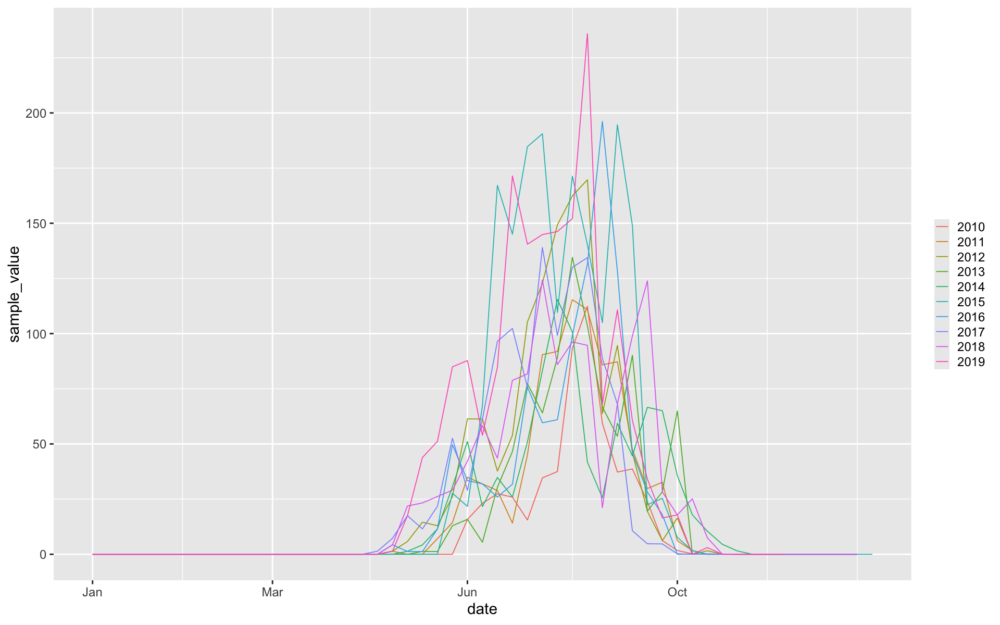

In [ ]:
dfibble |> gg_season(y = sample_value, max_col_discrete = 12)

Now this is already pretty cool. We can see that all years peak _approximately_ at the same time, but I'm sure you'll agree it's pretty messy.

As such, let's reaggregate this data temporarily to monthly data and re-make the seasonality plot.

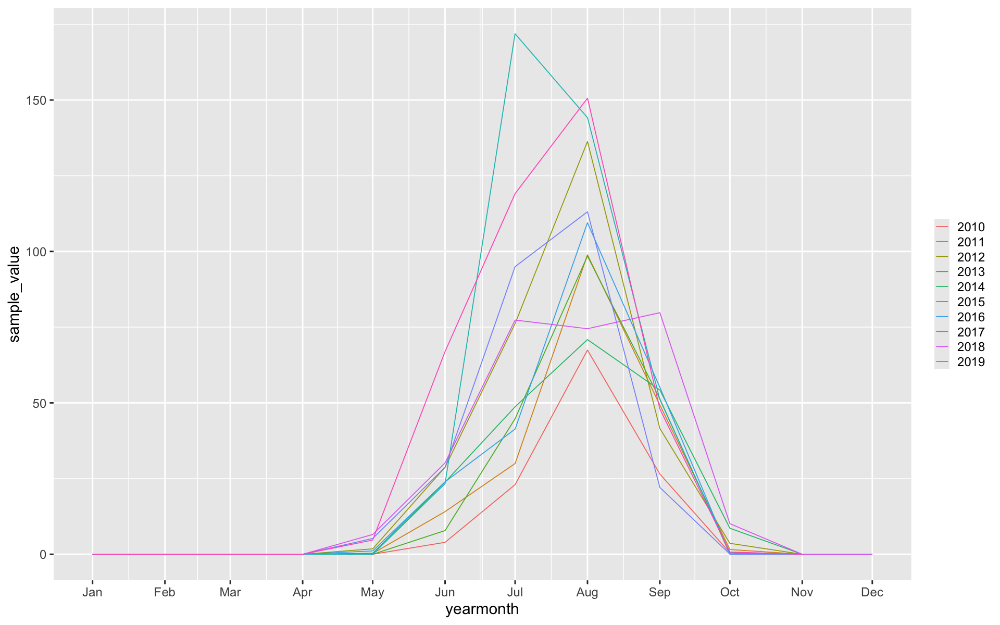

In [ ]:
dfibble |> 
  index_by(yearmonth = ~ yearmonth(.)) |> # Reaggregate to month-level, we must use a new column name for reasons unbeknownst to me
  summarise(sample_value = mean(sample_value)) |> 
  gg_season(y = sample_value, max_col_discrete = 12)

Isn't that better? We can now more clearly see that the data from 2015 peaked earlier and fairly high, similar to the data from 2019.

## Lag plots

Another plot that can be exceedingly useful is a lag plot. This plots values at time $t$ (on the x axis) against their values at time $t - l$ where $l$ is the lag distance.

$l$ is in the same units as the interval of the data (in our case, weeks).

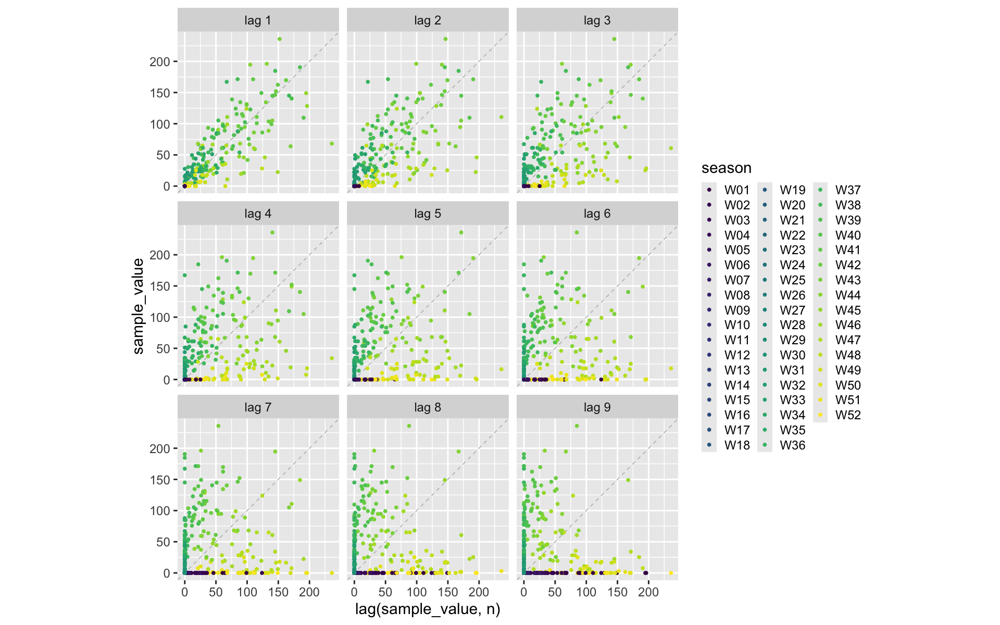

In [ ]:
dfibble |> 
  gg_lag(y = sample_value, geom="point")

When looking at this data, the colour of the dots indicates the week in the year from which the data originates.

Purple dots are at the head of the season, and yellow dots are towards the end. Is there any trend that you see here?

## Autocorrelation plots

Another useful tool for investigating the lag in a dataset is to directly investigate the autocorrelation within the data.

One excellent visual tool for this is to use the autocorrelation measures at different time lags.

This represents the correlation between the point at time $t$ and at time $t-l$ where $l$ is the lag.

We can do this using the `ACF()` function from `feasts`:

In [ ]:
dfibble |> ACF(sample_value, lag_max = 52)

lag,acf
<cf_lag>,<dbl>
1W,0.8646474
2W,0.7640465
3W,0.6737971
4W,0.5468455
5W,0.4419175
⋮,⋮
48W,0.4433745
49W,0.5246661
50W,0.6038654


This is all well and good but a dataframe of these values is not the easiest to interpret. Here is where the stunning `autoplot()` feature comes back into play.

If we pipe this ACF dataframe into the `autoplot()` we end up with something known as an ACF plot:

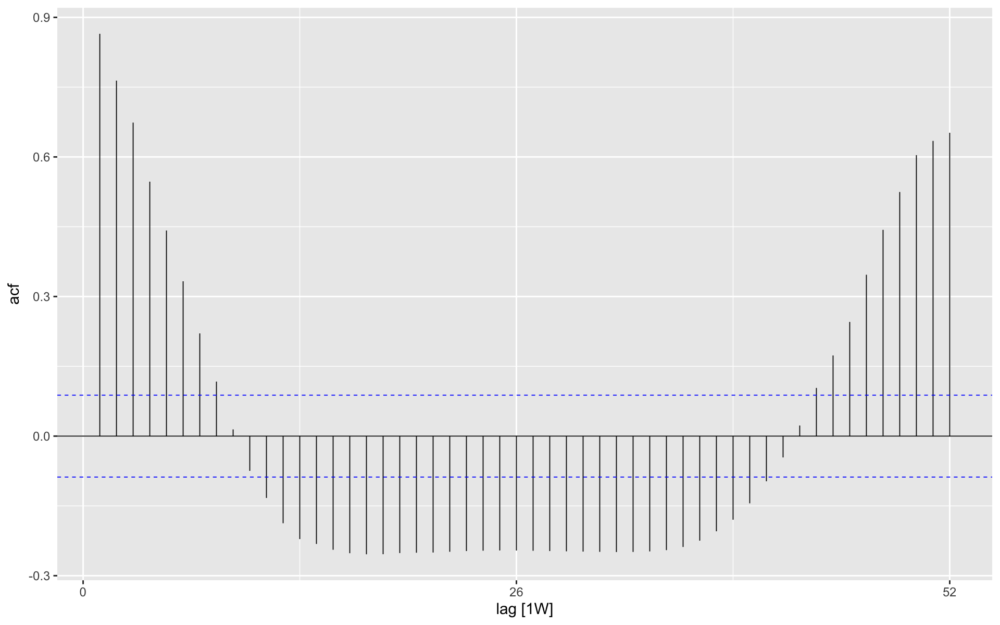

In [ ]:
dfibble |> ACF(sample_value, lag_max = 52) |> autoplot()

In this plot we can clearly see that there's some sort of trend going on, specifically it sort of looks like the graph of a cosine function of period 52.

That's because it pretty much is! This is a direct view into the seasonality of the data in this scenario. Where a given value in the height of the egg-laying season is compared with the value 26 weeks earlier, that is comparing to the value when nothing is laying eggs, so we end up with a calculated anticorrelation. However when comparing to data 52 weeks prior we see a decent positive correlation, as data one year in the past is similar to that at present!

Take a few minutes to look at this plot and try to make sure it makes sense. It's a very useful tool to have in your back pocket!

## Decomposition

Decomposition is the process of breaking an object into its component parts. When talking about time series data, these components generally fall into three categories:

1. A trend
2. Seasonal components
3. Random noise

For the examples in this first section about decomposition, let's pull some temperature data from another hub-linked source, the AREAdata project (AD).

❯ Loading AREAdata cache: temp-0 ...

✔ Loaded AREAdata cache temp-0.

❯ Loading AREAdata cache: temp-0 ...



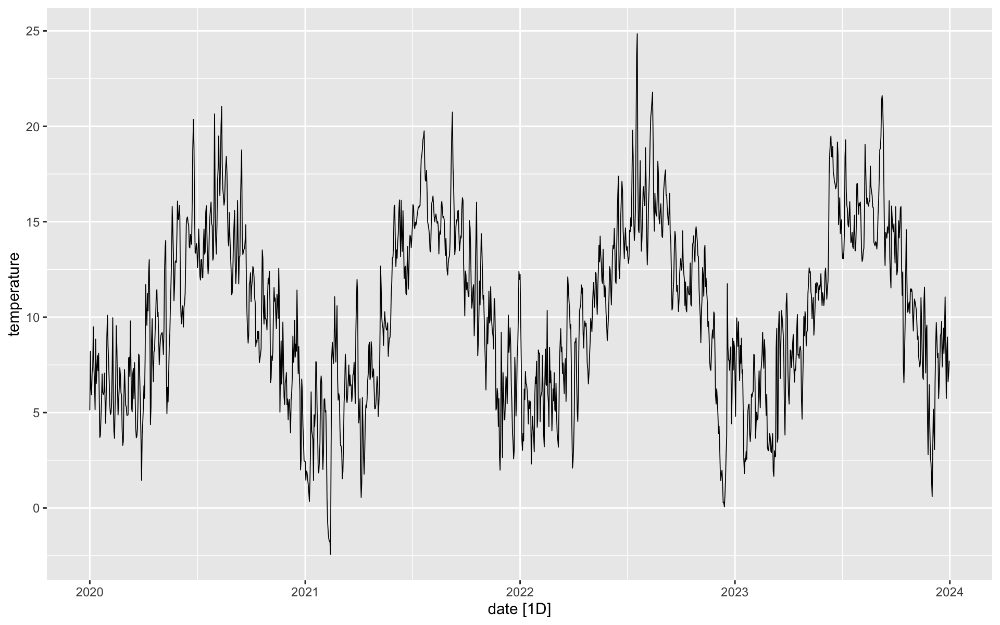

In [ ]:
addata <- fetch_ad(use_cache = TRUE) |>
  extract(places = "United Kingdom") |>  # Get only UK temperature date
  enframe() |>  # Convert into a df
  rename(date=name, temperature=value) |>  # Rename columns
  mutate(date=as_date(date)) |>  # Make sure the date column is actually a date
  tsibble(index=date)  # Convert to a tsibble as usual

# And plot it to take a look:
addata |> autoplot(.vars=temperature)

This data is the day-by-day mean temperature for the United Kingdom between 2020 and 2024.

It's very high resolution, so just for exploring it a bit easier, let's once again reaggregate it, this time to monthly data.

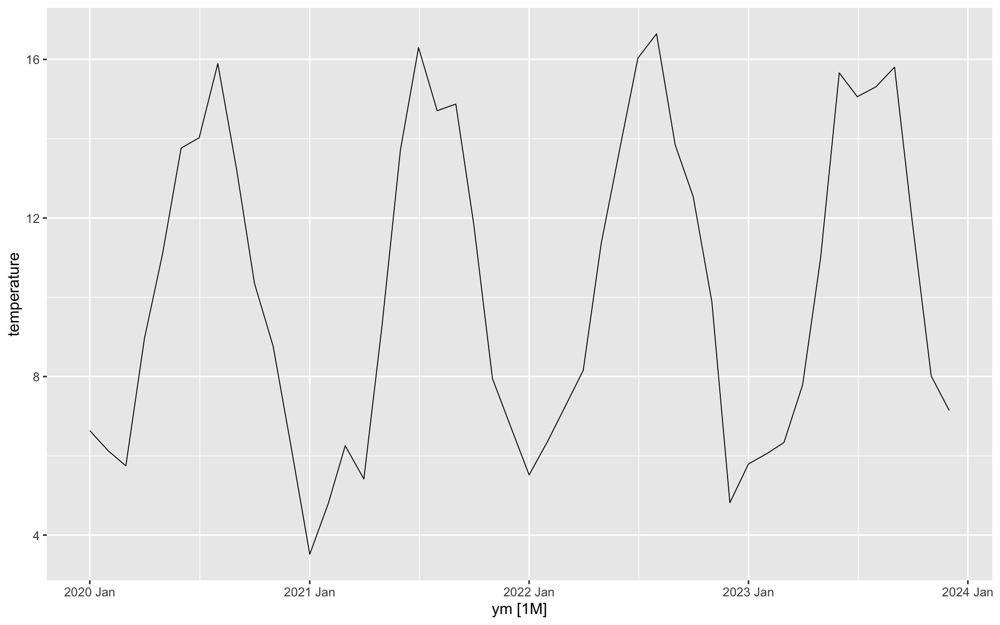

In [ ]:
addata_monthly <- addata |> index_by(ym = ~ yearmonth(.)) |>
  summarise(temperature = mean(temperature))

addata_monthly |> autoplot(.vars = temperature)

That's better! For this next bit don't focus so much on the code we are using.

We'll cover a lot of it in much more detail later, for now just look at the outputs.

Here is our full decomposition to refer back to:

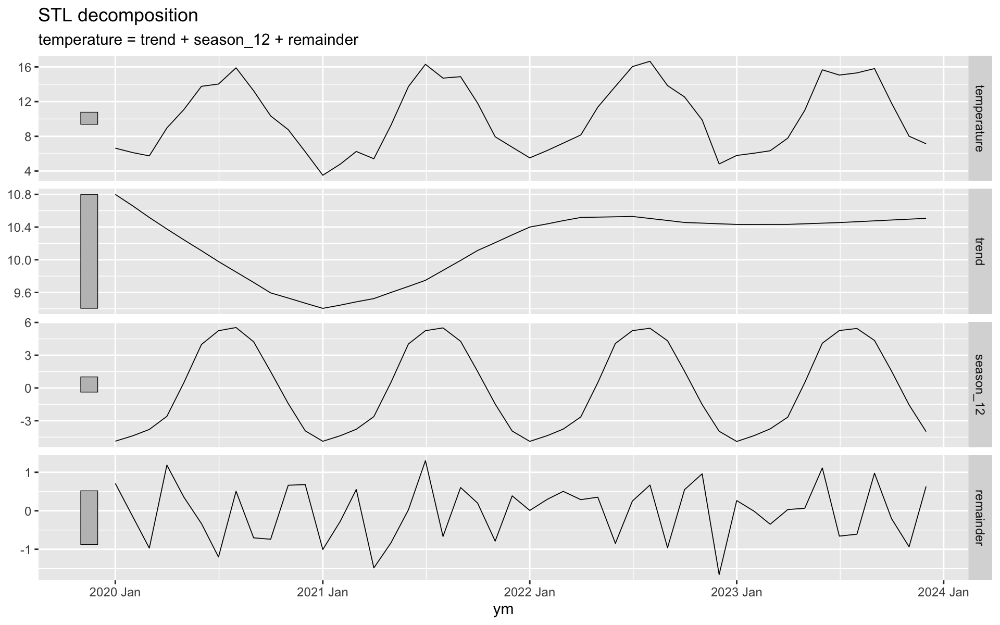

In [ ]:
addata_monthly_components <- addata_monthly |> 
  model(
  STL(temperature ~ trend() +
        season(period = 12))
) |> components()

addata_monthly_components |> autoplot()

### Trend

The trend of a time series is its general movement over time. If the overall value is increasing in general, the trend will go up.

If there are moments in time where the value is significantly lower than "usual", you may see a dip in the trend.

Here we can see that there is a bit of a dip around the winter of 2020/2021.

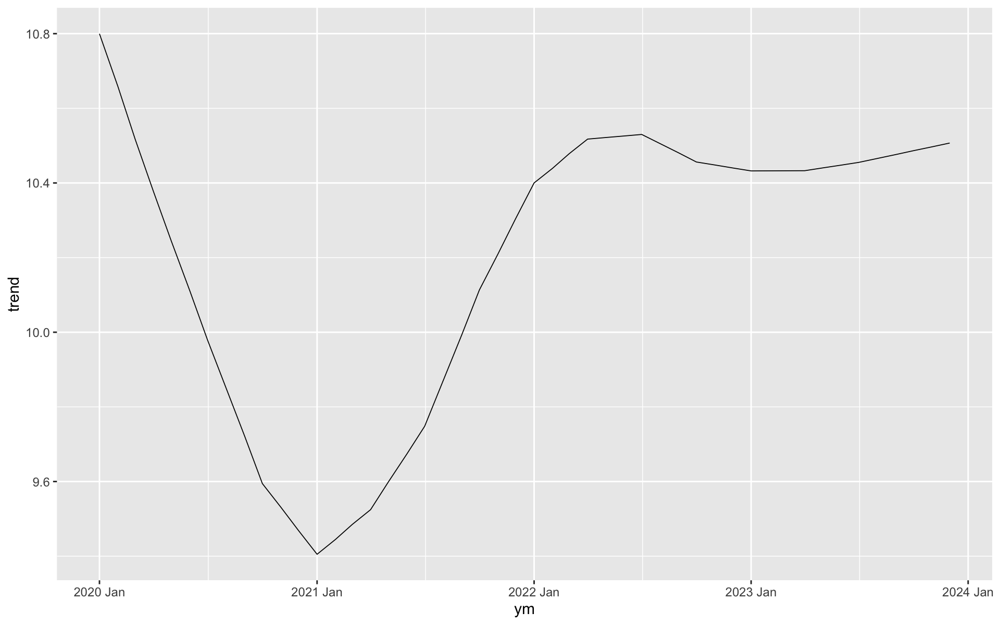

In [ ]:
addata_monthly_components |> ggplot(aes(x = ym, y=trend)) + geom_line()

Maybe we could [verify](https://www.metoffice.gov.uk/research/climate/maps-and-data/uk-temperature-rainfall-and-sunshine-anomaly-graphs) that this [really happened](https://en.wikipedia.org/wiki/2020%E2%80%9321_European_windstorm_season#Storm_Christoph) by looking at [some other](https://www.metoffice.gov.uk/about-us/news-and-media/media-centre/weather-and-climate-news/2021/2021-a-year-in-weather-a-review) [data sources](https://www.bbc.co.uk/weather/features/56944299).

Generally it's a good idea to verify that your analysis techniques are working by finding other information to assess whether your approach is valid.

### Seasonality

Seasonality is the name given to cyclic effects within a time series. These could be yearly cycles corresponding to changing temperatures across the year. They could also be daily cycles corresponding to people's work schedules.

In this case we expect a yearly cycle of temperatures corresponding to the different seasons within the UK.

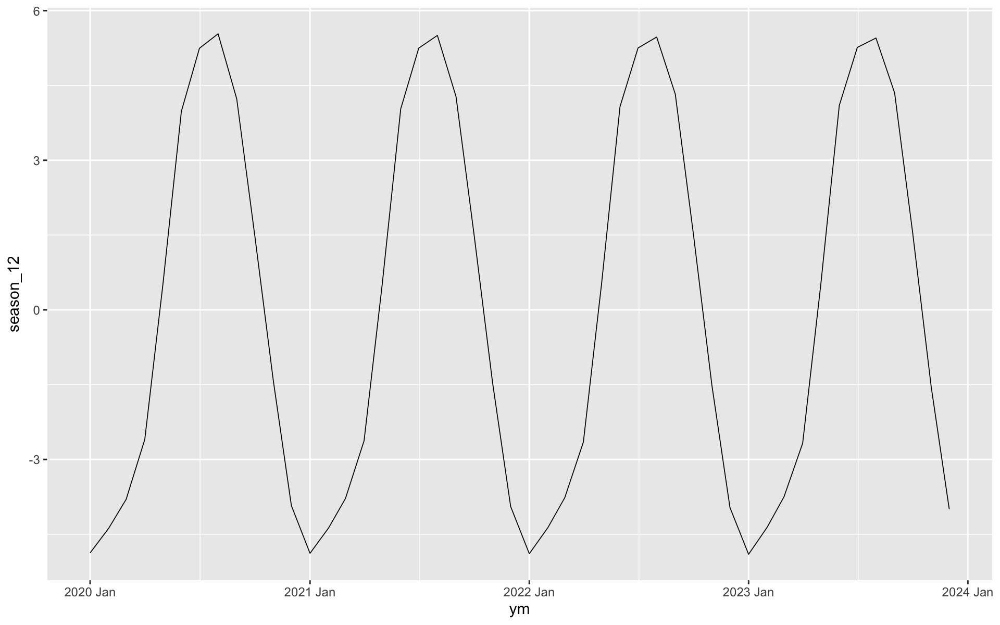

In [ ]:
addata_monthly_components |> ggplot(aes(x = ym, y=season_12)) + geom_line()

The amount of time between repeats of a cycle is known as the **period** of the seasonality.

Often the period of a seasonal signal is directly related to the physical mechanism/s that causes said signal.

### Random noise (or the remainder component)

The final component is generally a "noise" component. This contains any extra variability present in the data once the general trend and seasonal components have been removed.

This is often quite unpredictable and uncorrelated. Very generally speaking, we expect the random noise in most cases to be approximately [stationary](https://en.wikipedia.org/wiki/Stationary_process) and in an _additive_ model, to be centred around 0.

**Note:** if a process has a steady mean and variance over time, it is referred to as _stationary_. This is an important word that you may well come across when reading papers about time series.

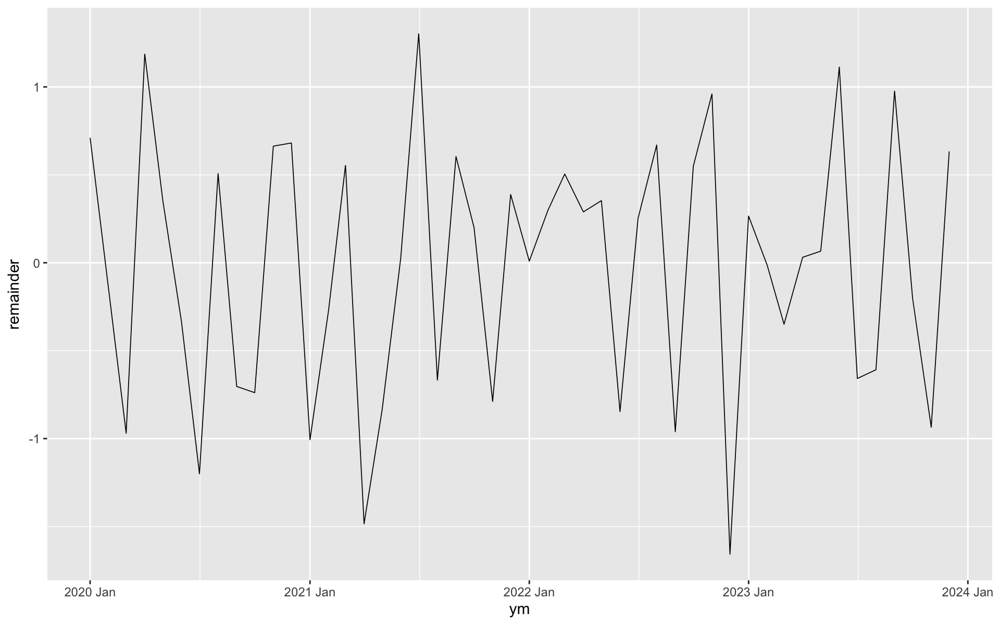

In [ ]:
addata_monthly_components |> ggplot(aes(x = ym, y=remainder)) + geom_line()

### Challenge

Time for an exercise! Don't worry about what the code does for now, instead just focus on the plot outputs.

1. Adapt the following code to get data for different countries. Have a look at their trend and seasonality components.
2. Use the code to specifically investigate one of the following countries: `Indonesia`, `Ecuador`, `Singapore`. What do you notice?

Remember to look carefully at the scale of the y axis on each subplot!


In [ ]:
fetch_ad(use_cache = TRUE) |>
  extract(places = "United Kingdom") |>  # Change the place name here!
  enframe() |>
  rename(date=name, temperature=value) |>
  mutate(date=as_date(date)) |>
  tsibble(index=date) |>
  index_by(ym = ~ yearmonth(.)) |>
  summarise(temperature = mean(temperature)) |>
  model(
    STL(temperature ~ trend() +
        season(period = 12))
  ) |> components() |>
  autoplot()

**Note:** If you are struggling to find the given name for a country within AD, enter the following command into R to get a list of all country names:

In [ ]:
rownames(fetch_ad(use_cache = TRUE))

---

### Additive decompositions

Now you've taken a look at the components of a time series decomposition, it's probably best to understand a little more about how to put one together yourself.

The simplest form of time series decomposition is known as a _classical decomposition_.

Classical decompositions contain a few assumptions about the components of the time series in question.

Generally a decomposition (specifically an _additive_ decomposition) expects that a time series $x_t$ can be written as the equation:

$$x_t = T_t + S_t + R_t$$

where $T_t$ is the trend, $S_t$ is a regular seasonal component, and $R_t$ is the random noise (or the "remainder").

In a classical decomposition:

- $S_t$ and $R_t$ are both assumed to have a mean of approximately 0
- $S_{t+p} = S_t$ for a given period $p$

Let's run an additive classical decomposition on the data we previously retrieved from `vecdyn`:

Warning message:
“Removed 26 rows containing missing values or values outside the scale range
(`geom_line()`).”


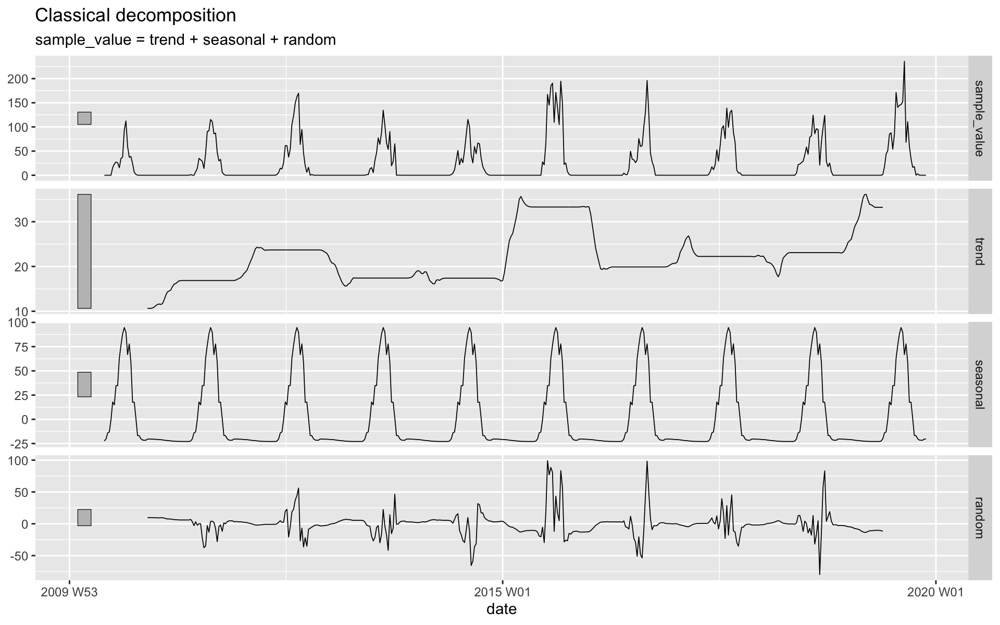

In [ ]:
dfibble |> 
  model(classical_decomposition(sample_value, type = "additive")) |> # Define the classical decompostion model to fit
  components() |> # Extract the components from the fitted model
  autoplot()

Okay, not a terrible fit at all. It's successfully derived a 52-week seasonal signal, and the random noise is somewhat random at the places where real data was located (remember that we filled in the intermediate gaps with 0s).

Let's shift to a different data set for some more examples. Specifically there is a dataset included with `fpp3` called `aus_arrivals`. This is a quarterly time series of tourist arrivals into Australia between 1981 and 2011, by country of origin.

Let's quickly take a look at arrivals just from the UK

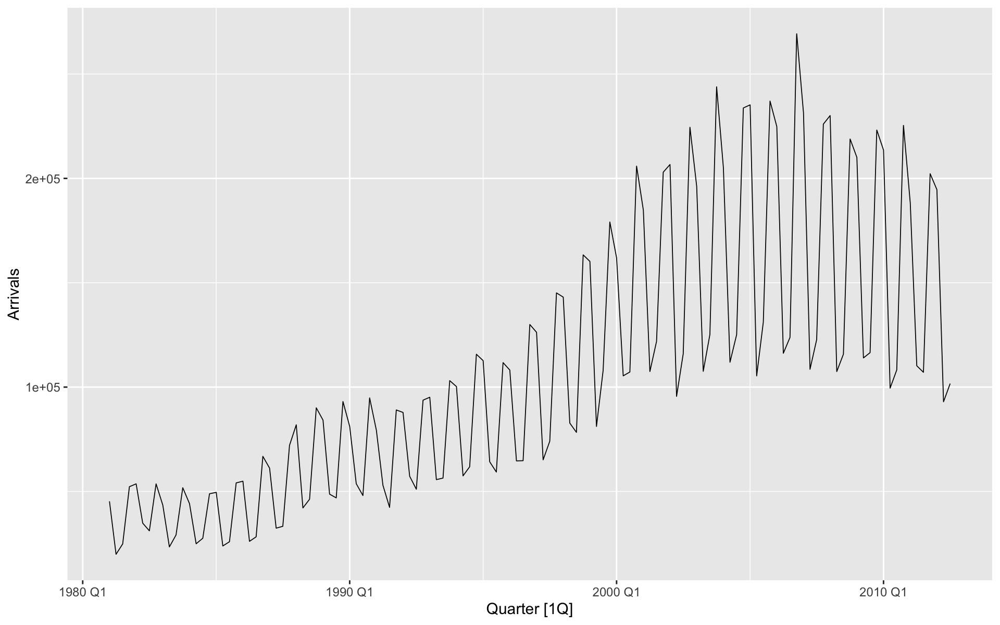

In [ ]:
aus_arrivals |> 
  filter(Origin == "UK") |> 
  autoplot(.vars = Arrivals)

You may notice something different here, let's try an additive classical decomposition to see how that looks:

Warning message:
“Removed 2 rows containing missing values or values outside the scale range
(`geom_line()`).”


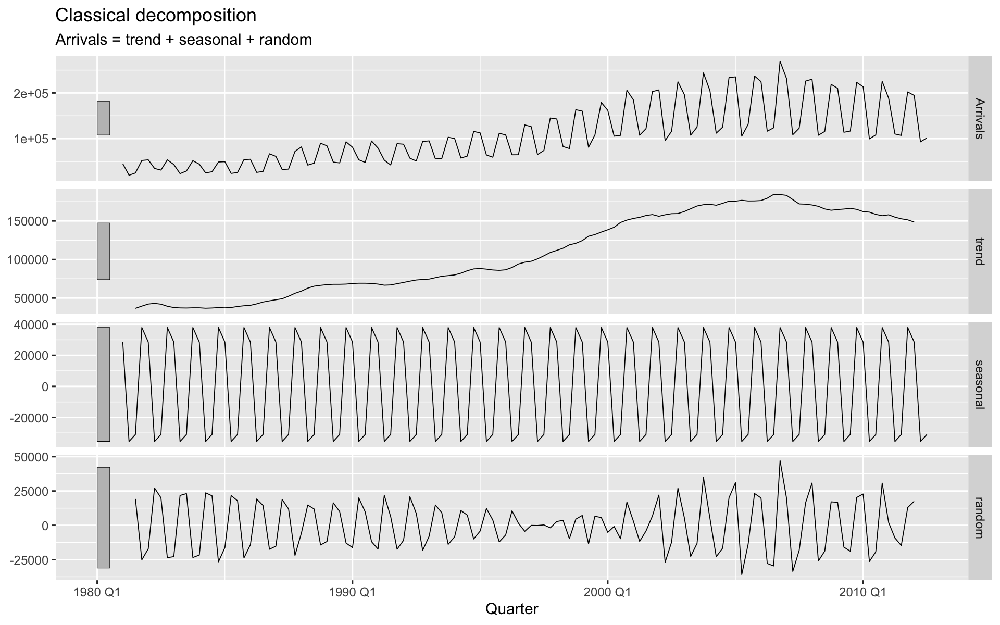

In [ ]:
aus_arrivals |> 
  filter(Origin == "UK") |> 
  model(
    classical_decomposition(Arrivals, type = "additive")
  ) |> 
  components() |> 
  autoplot(.vars = Arrivals)

Hmm, generally we got a sensible trend out, but that random part is looking a bit odd. The scale of it is all over the place!

If you look back at the raw data (top segment of this plot) you can see that as the mean arrivals grows larger, the seasonal variance also seems to get wider.

This is a classic indication of a _multiplicative_ process.

### Multiplicative decomposition

A multiplicative decomposition uses a slightly different equation to additive decomposition. You may already be able to guess its form:

$$x_t = T_t S_t R_t$$

Out of interest, due to the magic of _logarithms_ this is functionally identical to stating the following additive process:

$$\log{x_t} = \log{T_t} + \log{S_t} + \log{R_t}$$

Warning message:
“Removed 2 rows containing missing values or values outside the scale range
(`geom_line()`).”


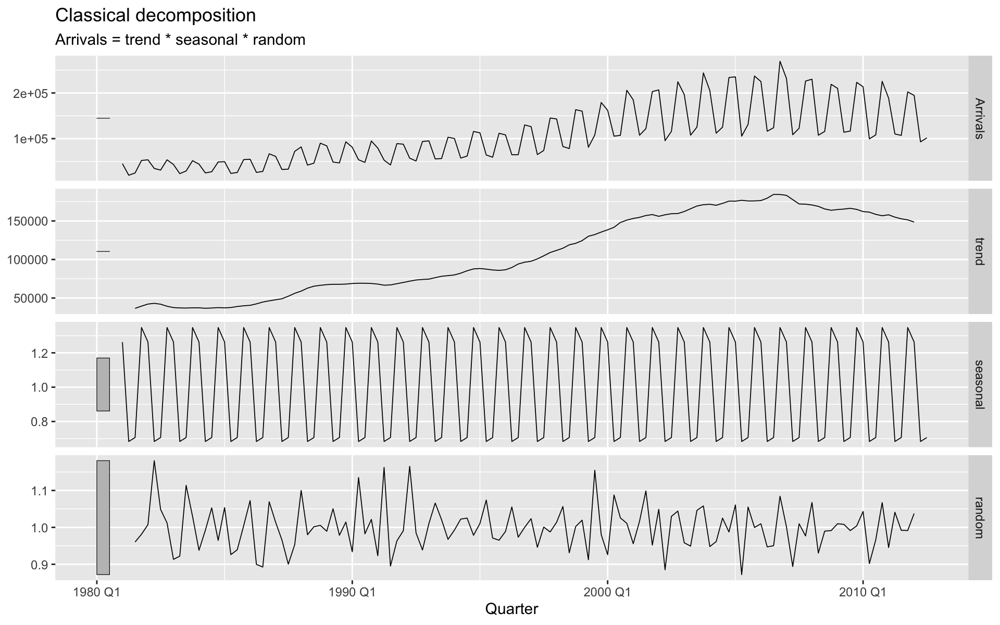

In [ ]:
aus_arrivals |> 
  filter(Origin == "UK") |> 
  model(
    classical_decomposition(Arrivals, type = "mult")
  ) |> 
  components() |> 
  autoplot(.vars = Arrivals)

Whilst the trend and seasonal signal period are basically the same here, the random noise component seems a lot more nicely behaved and fairly stationary. (Remember, _stationary_ processes have a steady mean and variance over time.)

Let's take a look at another multiplicative decomposition from this data, specifically the arrivals from Japan:

Warning message:
“Removed 2 rows containing missing values or values outside the scale range
(`geom_line()`).”


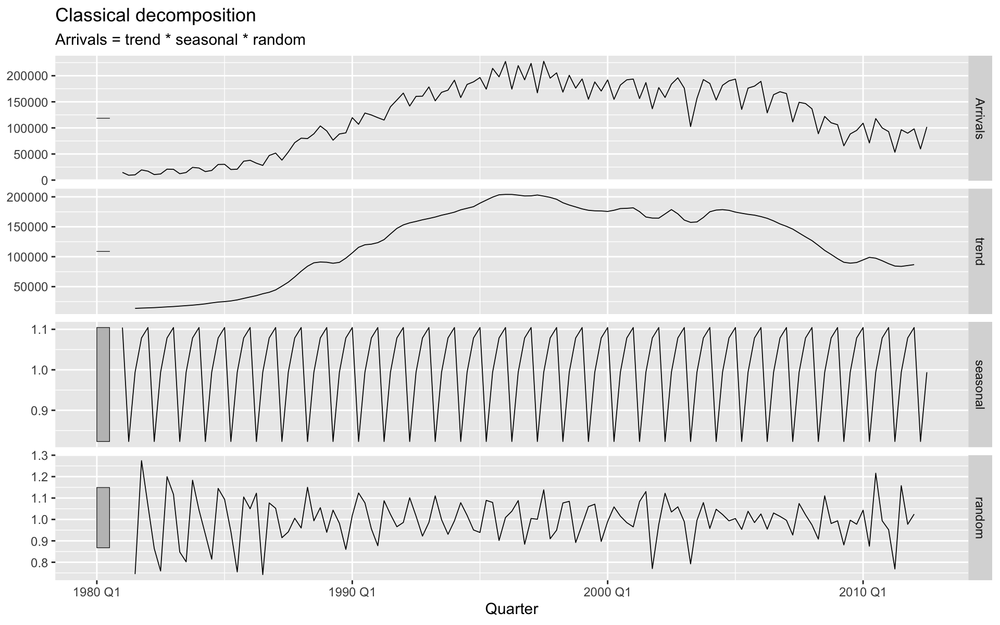

In [ ]:
aus_arrivals |> 
  filter(Origin == "Japan") |> 
  model(
    classical_decomposition(Arrivals, type = "mult")
  ) |> 
  components() |> 
  autoplot(.vars = Arrivals)

This is a bit more troubling. That random component is still varying over time, and there seems to be some periodic signal in the first years of data.

It seems like the seasonality of this data changes at around 1995, however classical decomposition assumes a constant seasonality throughout the dataset.

[We're gonna need a bigger boat.](https://images2.minutemediacdn.com/image/upload/c_fill,w_1200,ar_4:3,f_auto,q_auto,g_auto/shape/cover/sport/screen-shot-2020-05-14-at-12-15-19-pm-a831ebd9882da268434b34ed117a9410.jpg)

### Advanced decomposition

There are more advanced methods of time series decomposition, the best known of which is called _STL_ decomposition (you may have seen this earlier if you paid close attention to the plot labels in the earlier temperature exercise).

STL decomposition stands for _Seasonal and Trend decomposition using LOESS_. LOESS is a form of nonparametric smoothing using local regression, and is used throughout the STL process.

Let's have another go at that japan arrivals time series, but this time using STL:

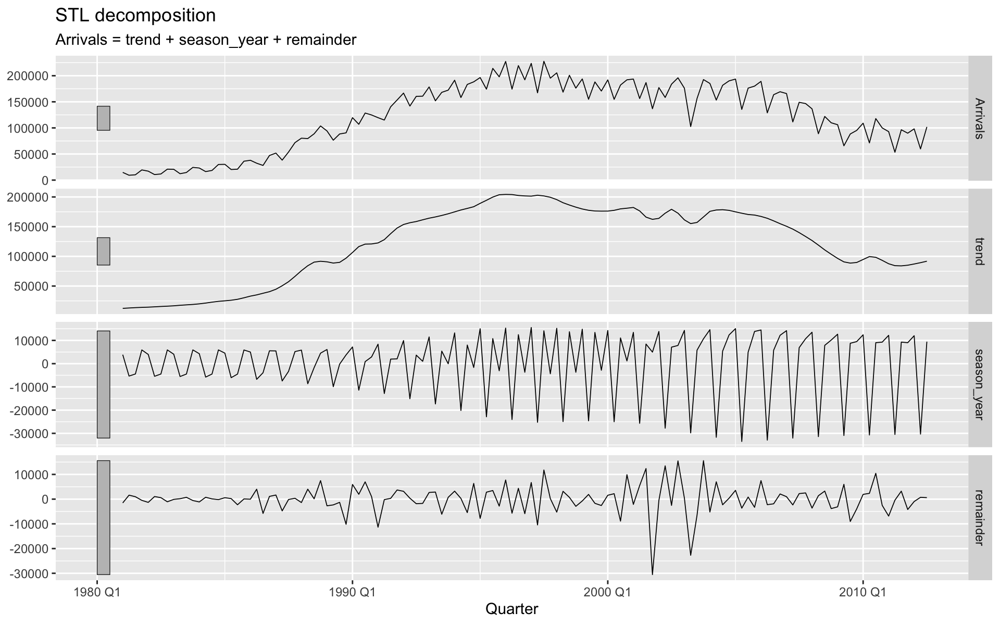

In [ ]:
aus_arrivals |> 
  filter(Origin == "Japan") |> 
  model(
    STL(Arrivals ~ trend() + season())  # You may recognise this syntax from fitting linear models!
  ) |> 
  components() |> 
  autoplot(.vars = Arrivals)

This is looking a lot better in general, seasonality is now allowed to vary over time (mirroring what seems to be happening in the underlying process and thus in the data).

That has lead to a random (remainder) component with no repeating patterns or other weirdness. Seems like a much better decomposition!

Let's try doing an STL decomposition on the `vecdyn` data we pulled earlier:

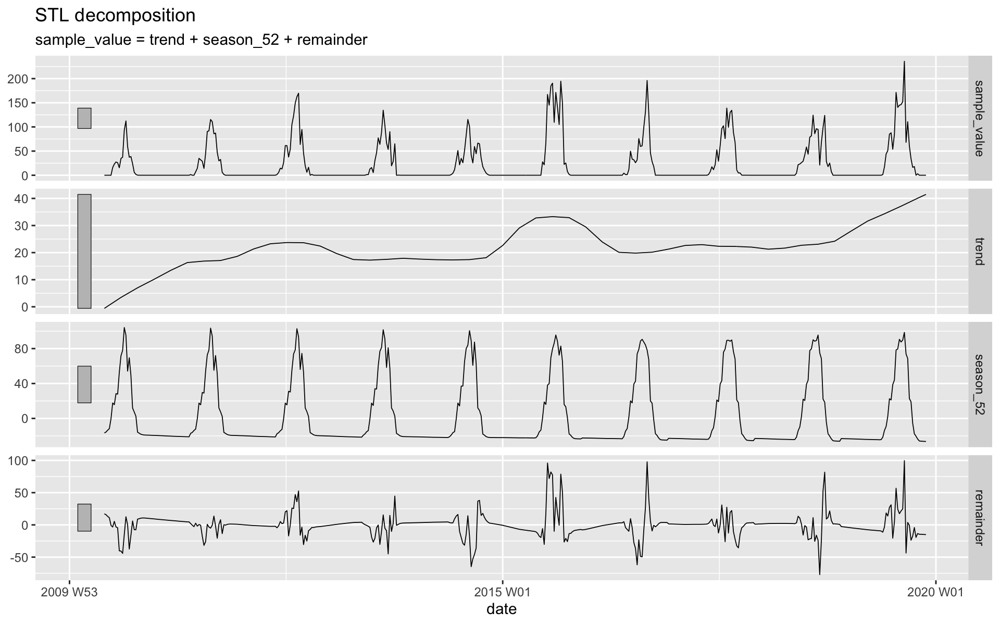

In [ ]:
dfibble |> 
  model(
    STL(sample_value ~ trend() +
        season(period = 52))  # We have a 52 week periodicity as there is one major peak in the year.
  ) |> 
  components() |>
  autoplot()

The trend here looks a lot better than it did before! This is because the moving average method used by the classical decomposition estimation (provided by `stats::decompose()`) is using an inappropriate window size for the scale of the data, whilst LOESS handles it much more clearly.

It is actually possible to change this manually for classical decomposition, but frankly it's a bit of an arcane process.

**Note:** when deciding on an appropriate periodicity to encode into an STL model, you _must_ keep in mind the fundamental resolution of your data.

For this `vecdyn` data, it is in weekly form, so we cannot have a useful periodicity of 1 week or below.

STL decompositions can also handle multiple seasonal signals with different periods. This can be achieved by simply adding extra `+ season()` lines within the `STL()` call.

## Forecasting

A major goal in time series analysis is _forecasting_. This is essentially asking the following question:

> Given this data for the past, what will the data in the future look like?

There are many different approaches to forecasting, and the "correct" (or "incorrect") one to use is determined by a number of things. If you only care about the mean in a relatively stationary time series, that is very different to requiring accurate representation of processes with multiple seasonal components.

Next let's explore few of the simplest forecasting methods. Each of these will be represented as a simple statement of the idea followed by a small explanation.

In [ ]:
addata_fit <- addata_monthly |> 
  model(
      Mean = MEAN(temperature),
      Naive = NAIVE(temperature),
      SeasonalNaive = SNAIVE(temperature),
      LinearTrend = TSLM(temperature ~ trend()),
      Drift = NAIVE(temperature ~ drift())
      )
addata_fc <- addata_fit |> 
  forecast(h=12)

### Mean

> The mean of the historical values will be all future values

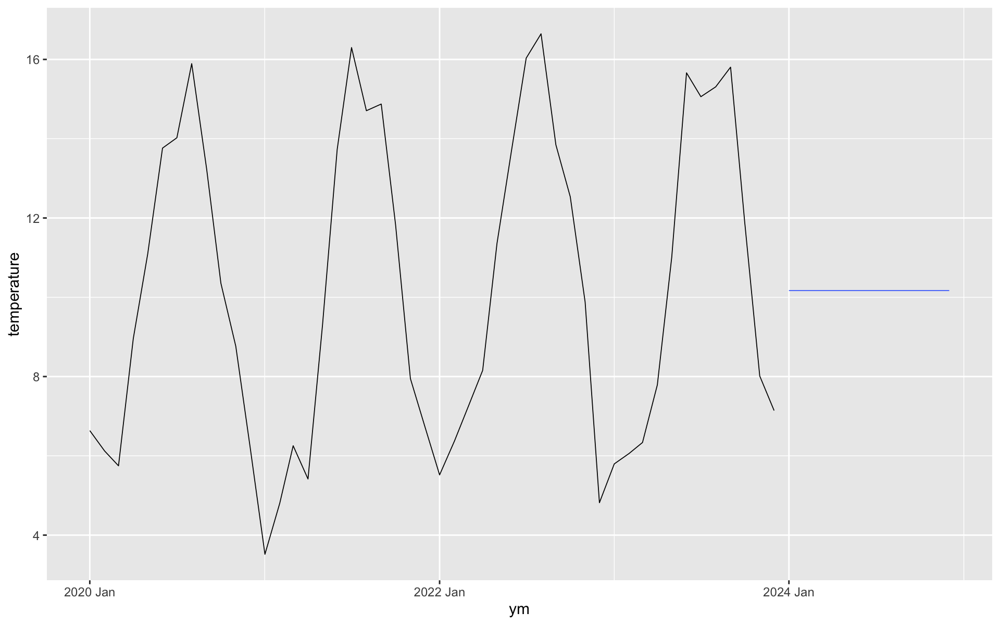

In [ ]:
addata_fc |> filter(.model == "Mean") |>  autoplot(addata_monthly, level = NULL)

This is simple as it comes. Essentially we predict that the mean of all the data is the value we care about, and predict forwards linearly.

### Naive

> The most recent historical value will be all future values

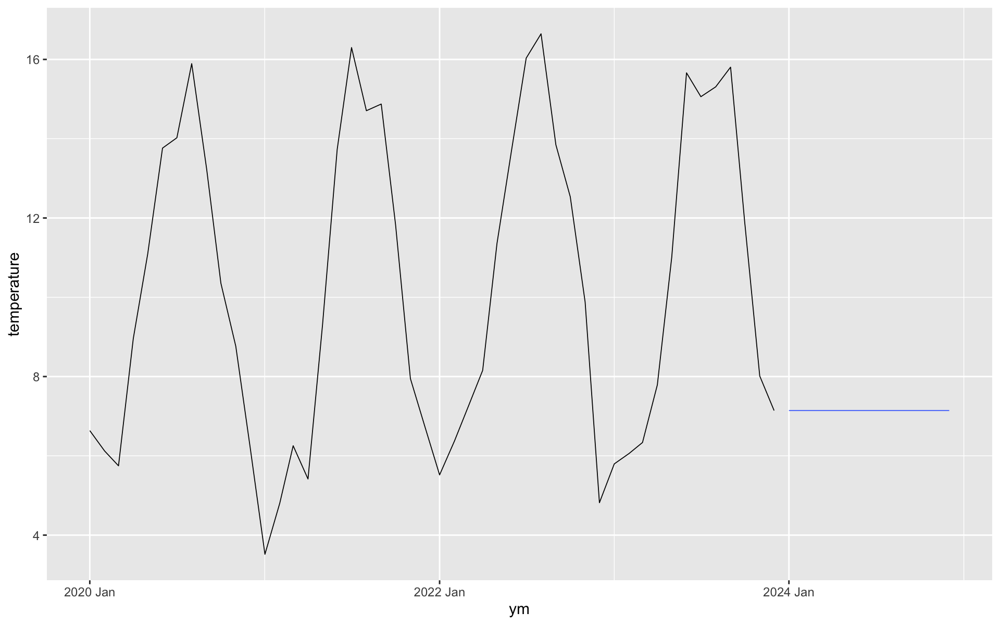

In [ ]:
addata_fc |> filter(.model == "Naive") |>  autoplot(addata_monthly, level = NULL)

This is another very simple model, it's good when a system has settled to a steady state after some sort of ramping up period.

It is also good if the underlying process is what is known as a [martingale ](https://en.wikipedia.org/wiki/Martingale_(probability_theory)).

### Seasonal naive

> The most recent season will be all future seasons

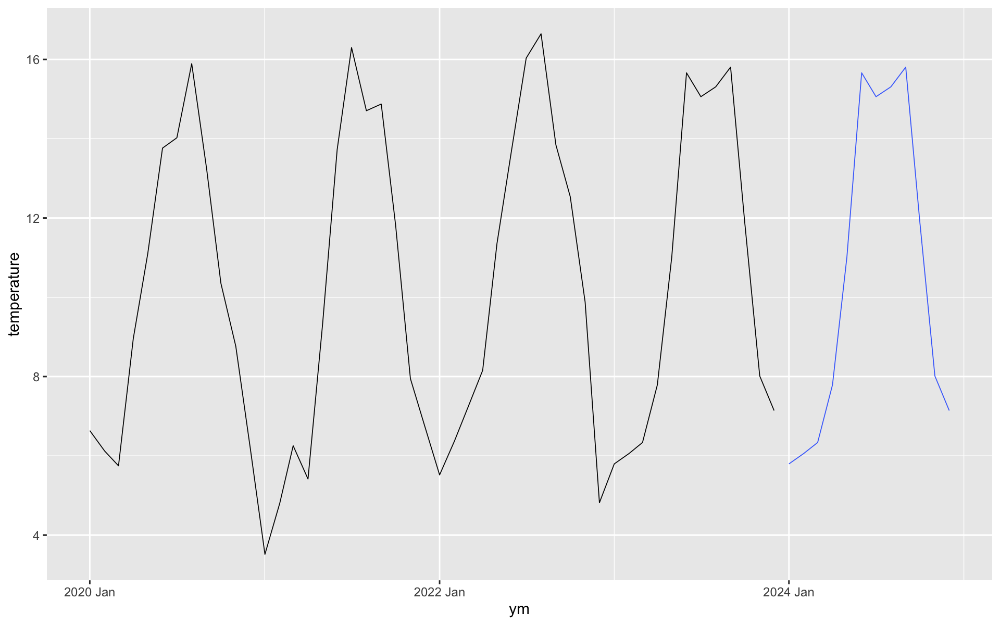

In [ ]:
addata_fc |> filter(.model == "SeasonalNaive") |>  autoplot(addata_monthly, level = NULL)

Seasonal naive models are generally pretty competent where a system has a strong and repeated seasonal component dominating the variation. Such as in this example of temperature across a year in the UK. 

### Linear trend

> The linear trend of all historical values will continue onwards

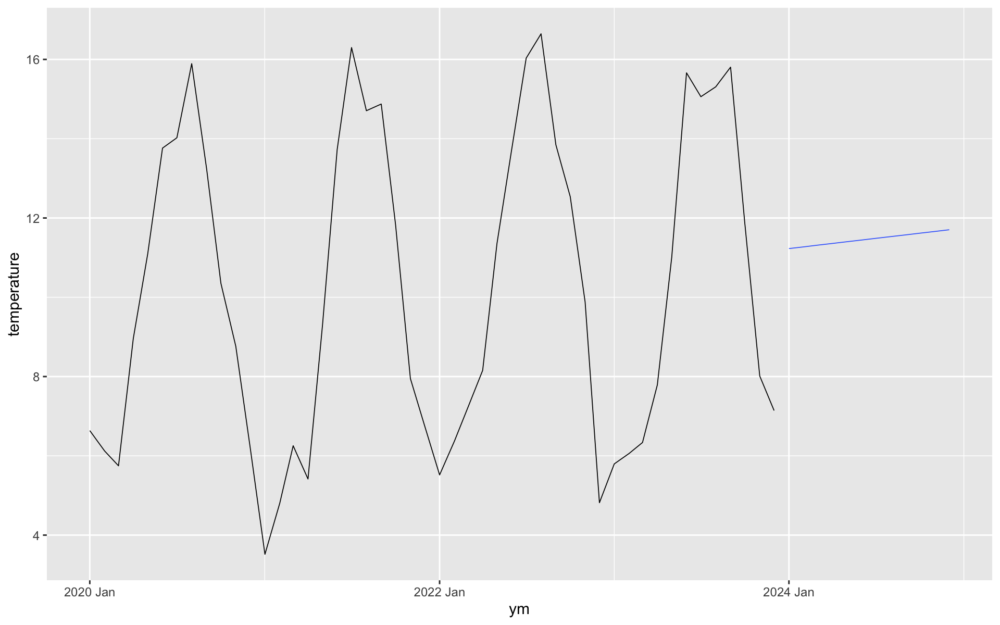

In [ ]:
addata_fc |> filter(.model == "LinearTrend") |>  autoplot(addata_monthly, level = NULL)

The linear trend assumes that the data linearly trends in a particular direction, and extrapolates that general trend forwards. It is good when...well...the data has a significant linear trend.

### Drift

> The trend between the first and last historical values will continue onwards

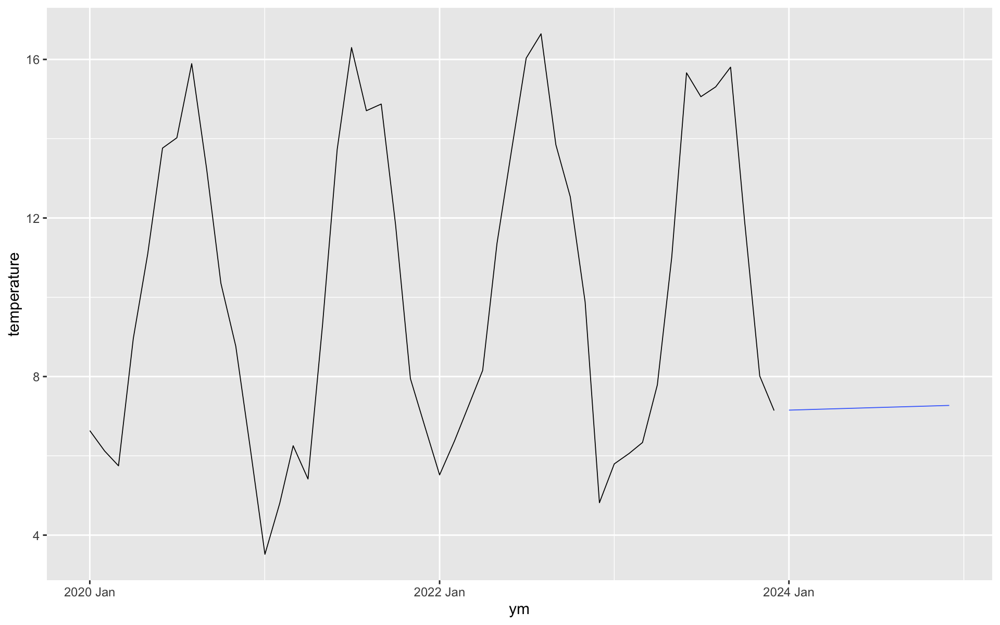

In [ ]:
addata_fc |> filter(.model == "Drift") |>  autoplot(addata_monthly, level = NULL)

The drift method is a variant of the linear trend, however instead of fitting a linear model, it instead approximates the rate of change across the data using the difference between the first and last data points.

This can generally deal better with time series containing more extreme random fluctuations, but could be nonsensical if the data does not contain a full set of complete seasonal periods.

## Simple forecasting using `fable`

The `fable` package has already been used quite a lot throughout this lesson so far. Its main purpose is to make the process of constructing and fitting models to time series data easy and reliable.

The following code generates all of the models listed above for the UK temperature data:

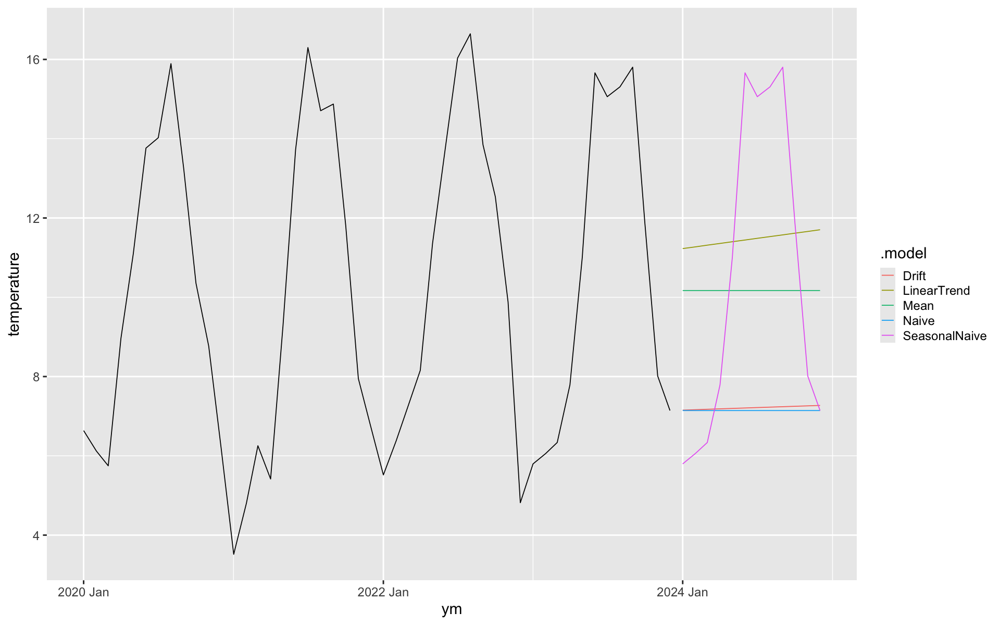

In [ ]:
addata_fit <- addata_monthly |> 
  model(  # Specify the forecasting models to fit
      Mean = MEAN(temperature),
      Naive = NAIVE(temperature),
      SeasonalNaive = SNAIVE(temperature),
      LinearTrend = TSLM(temperature ~ trend()),
      Drift = NAIVE(temperature ~ drift())
      )

addata_fc <- addata_fit |> 
  forecast(h=12) # Generate a forecast of 12 time steps

addata_fc |> autoplot(
  addata_monthly,  # Plot the original data alongside the model data, !! IMPORTANT !!
  level = NULL     # Suppresses confidence intervals for now with the level argument
  )

### Simple forecasting exercise

Try fitting a few of these models to the `vecdyn` data we pulled above (currently in the variable `dfibble`).

Are any models particularly bad or good? Why do you think that might be?

_Rather than copying the above code from the workbook, try to type it out yourself!_

## Forecasting from decomposition

Whilst the previous forecasting methods were good for time series with simple patterns underlying them, most data you will encounter from ecological systems are more complex.

They may well have odd trends, multiple seasonal components, or complex random elements at play.

Luckily we have already got ways to separate out the seasonality and other factors. We can then predict these individually and put them back together at the end to have a seasonally-aware forecast.

More formally, when forecasting using decomposition, we use a modified version of the typical time series equation. This splits the signal into a **seasonal** ($S_t$) and a **seasonally-adjusted** ($A_t$) component:

$$x_t = S_t + A_t$$

Where $A_t = T_t + R_t$.

`fable` makes such an approach relatively trivial. So let's do it on the `vecdyn` data we used in the simple forecasting exercise above:


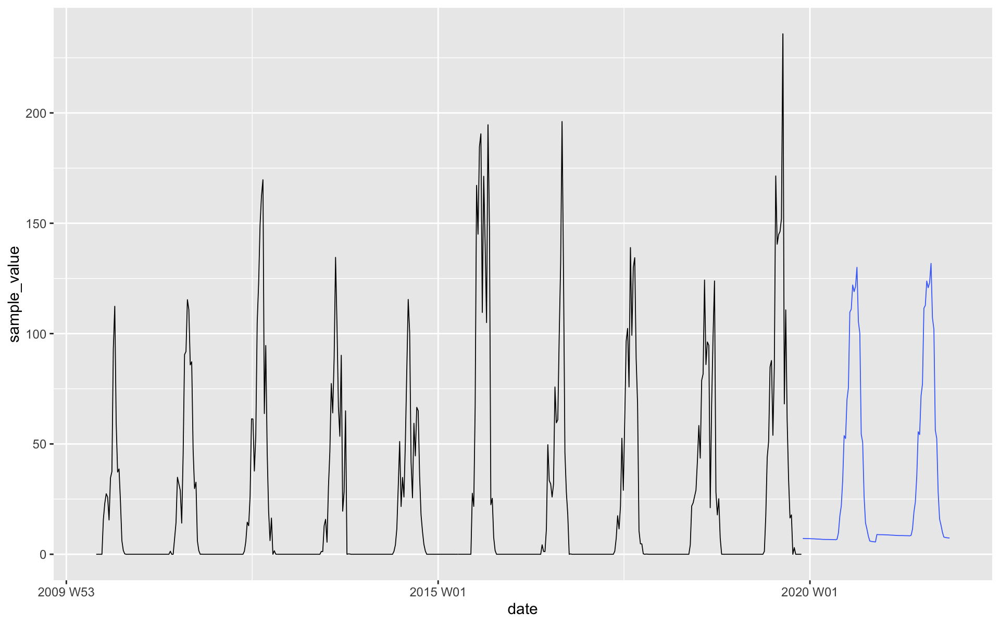

In [ ]:
dfibble |> 
  model(StlModel = decomposition_model(  # Specify that we are doing a decomposition
    STL(sample_value),  # Method for decomposition
    TSLM(season_adjust ~ trend()),  # Model for seasonally adjusted component
    SNAIVE(season_year)  # Model the seasonal component
  )) |> 
  forecast(h = 104) |> 
  autoplot(dfibble, level = NULL)

### Transformations

We have not covered transformations in great detail during this tutorial, however I'm going to mention one here specifically to solve a problem.

If we look at the forecast from our model here, everything looks good except the baseline out-of-season values seem to be going up (and are no longer 0)!

This is a problem. From a process-focused perspective this has arisen because the vector dynamics shown here are actually borne from two distinct processes:

1. The survival of adult mosquitoes
2. The breeding cycle of adult mosquitoes

Within a year, process 2 is fundamentally dependent on process 1 (you can't have eggs being laid if there are no mosquitoes to lay them)!

As such, the time series has vastly different local variance depending on where in the season you are. This means that no matter which way you look at it overall, either the peaks or the flat troughs are kind of "outliers", which is skewing the overall trend slightly upwards when it shouldn't.

One way we can deal with such a problem in this _particular_ circumstance is to perform a transformation of the input data, and a back transform of the resultant forecast.

A log transform would squash down the difference magnitude between the breeding and fallow seasons, however you cannot take the log of 0!

Luckily there is another similar transformation called `log1p()`, which performs a log transform after adding a small amount to every data point. We must then reverse this after forecasting, **however** this is something `fable` can do for us automagically!

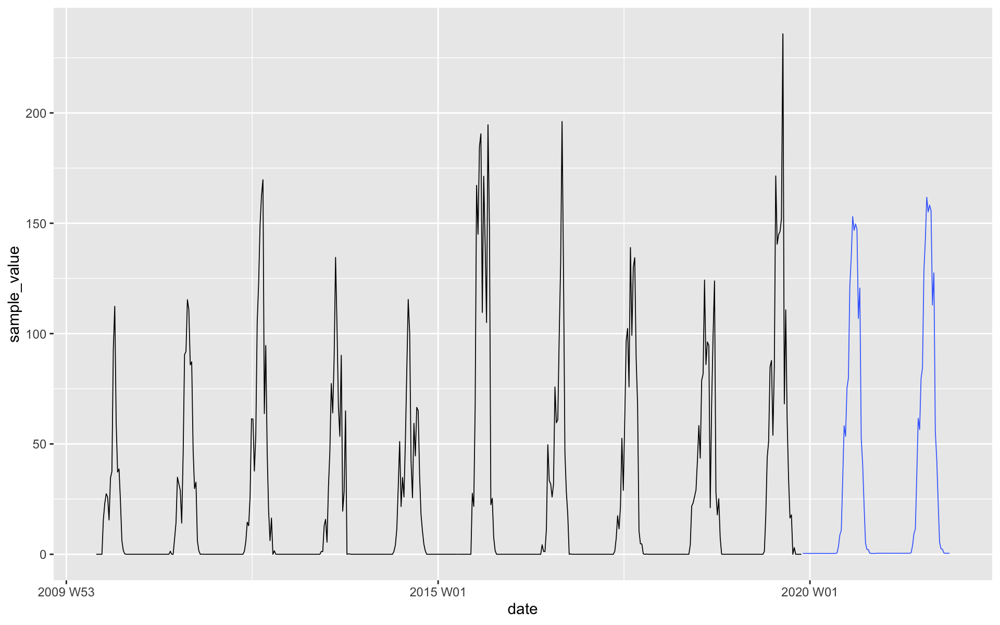

In [ ]:
dfibble |> 
  model(StlModel = decomposition_model(
    STL(log1p(sample_value)),  # Now we are working on the transformed variable
    TSLM(season_adjust ~ trend()),  # Everything else is the same
    SNAIVE(season_year)
  )) |> 
  forecast(h = 104) |> 
  autoplot(dfibble, level = NULL)

And look at that! The prediction looks pretty damn good! (If I do say so myself).

## Exponential smoothing

One family of easily fit (but very capable) forecasting methods is called _exponential smoothing_.

In `fable` these are all fit using the `ETS()` function (Error, Trend, Seasonal) with slightly different parameter setups.

All calls follow the same basic form, for example:

```
ETS(sample_value ~ error("A") + trend("N") + season("N"))
```

### `ETS()` parameters

Any call to `ETS()` in fable is constructed in a similar manner, with three individual components.

#### `error()`

The error function determines the structure of the "noise" term of the model.

This could be either `"A"` for additive noise, or `"M"` for multiplicative noise.

#### `trend()`

Trend is used to specify the form of the trend within the data, and to parameterise any smoothing or dampening performed on the trend.

This could be `"A"/"M"` as in `error()`, however it can also be dampened versions of these (`"Ad"/"Md"` respectively). Finally it can also be `"N"` to signify no trend term.

#### `season()`

Season (predictably) specifies the seasonal component of the data. This can again be `"A"/"M"/"N"` for Additive, Multiplicative, or None.

#### Unstable formulations

Whilst generally each term can be freely set to whatever combination of settings you choose, there are some combinations that are pretty unstable and will not fit reliably.

These are `ETS(A, A, M)`, `ETS(A, N, M)` and `ETS(A, Ad, M)`.

Also when time series contain 0 or negative values, an error term of `"M"` will not work.

For full details of the ETS formulation and associated terms, use the command `?ETS` in your R console to bring up the documentation.

### Simple exponential smoothing

Instead of weighting all data equally (e.g. the mean method) or only considering the final point (the naive method), simple exponential smoothing (SES) weights more recent values highly.

The formula for this weighting is a bit complicated, however there are two parameters of interest.

$\alpha$ is the weighting of the most recent observation. This also determines the _rate of decay_ of the weighting.

$j_0$ determines the scale for the final forecast output. It is in the same units as the response variable.

The general weighting for $\alpha = 0.2$ looks something like this:

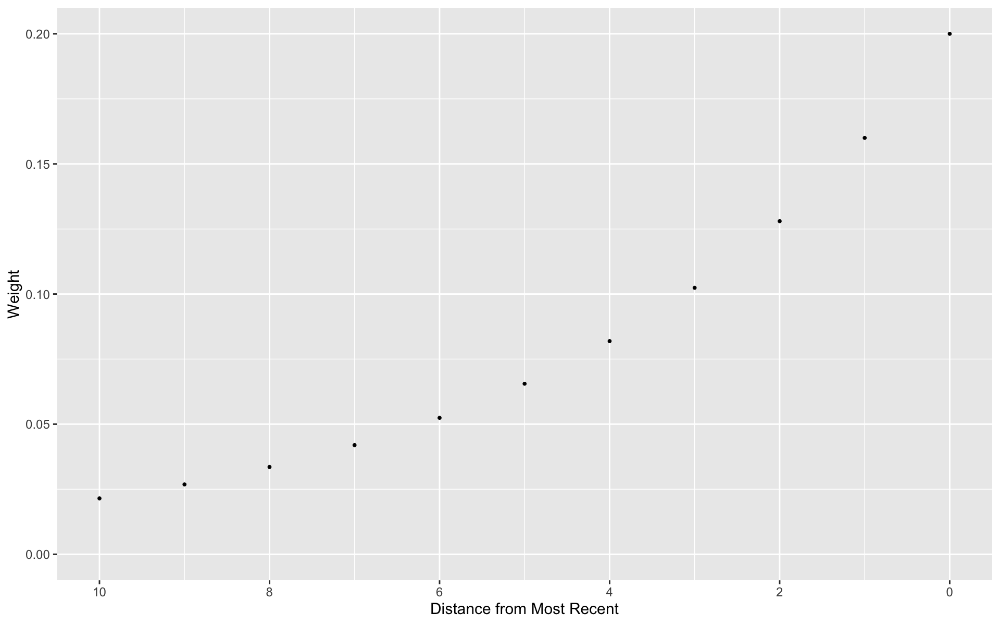

In [ ]:
alpha <- 0.2
weights <- tibble(lag_amount = 0:10,
                  weight = alpha * (1 - alpha) ** lag_amount)
weights |>
    ggplot(aes(x = lag_amount, y = weight)) +
    geom_point() +
  ylim(c(0, 0.2)) +
  scale_x_reverse(limits = c(10,0), breaks = seq(10,0,-2)) + 
  labs(x = "Distance from Most Recent", y = "Weight")

**Note:** There is a reversed x-axis here. Time series typically proceed from left to right, and as such it is most intuitive to look at it this way (in my humble opinion).

A SES model can be fit using the following ETS formulation:
```
ETS(X ~ error("A") + trend("N") + season("N"))
```

### Holt's linear trend & Damped trend approaches

Holt's linear trend is similar to a mix of the basic linear trend / drift approaches explored earlier, and a more naive approach by employing exponential smoothing.

In essence it fits an SES version of the trend and then calculates the difference between this and the best estimate for a given position on the time series. It then performs a set of weighted averages to calculate a local linear model that accounts for the general trend within the local region. Finally this linear model is simply extended to the number of extra time steps one wishes to forecast.

The damped trend variant is almost exactly the same, but with an extra condition. Holt's linear trend tends to projects very optimistically that a given local trend with continue indefinitely. Over large scales this can lead to a trend that just shoots off in an unrealistic manner.

To compensate for this, the damped trend assumes that any significant change will probably level out over time, and so forces the trend to instead asymptote more and more quickly using a damping factor called $\phi$. As $\phi$ approaches 0, the damping effect increases, with a value of 0 being equivalent to a truly naive model from earlier and a value of 1 simply being the Holt's linear trend.

These are formulated as follows in ETS:

Holt's linear trend:
```
ETS(X ~ error("A") + trend("A") + season("N"))
```

Damped method:
```
ETS(X ~ error("A") + trend("Ad", phi = 0.9) + season("N"))
```

### Holt-Winters' method

The final form of Exponential smoothing we will consider here is the Holt-Winters' method.

This extends the previous methods to incorporate seasonality through concepts from time-series decomposition, and can be performed both additively and multiplicatively as you see in typical decomposition.

In essence this performs the same sort of weighted average between a smoothed trend and a local best-fit, however it also includes a seasonal component to override some of the local linearity.

Damping Holt-Winters' models _only applies damping to the trend component_ whilst keeping the seasonality component as is. This means that with low $\phi$ values, instead of tending towards an asymptote, the seasonal component dominates the predicted response more and more.

Additive Holt-Winters:
```
ETS(X ~ error("A") + trend("A") + season("A"))
```

Multiplicative Holt-Winters:
```
ETS(X ~ error("M") + trend("A") + season("M"))
```

Damped additive Holt-Winters:
```
ETS(X ~ error("A") + trend("Ad") + season("A"))
```

Damped multiplicative Holt-Winters:
```
ETS(X ~ error("M") + trend("Ad") + season("M"))
```

### Examples

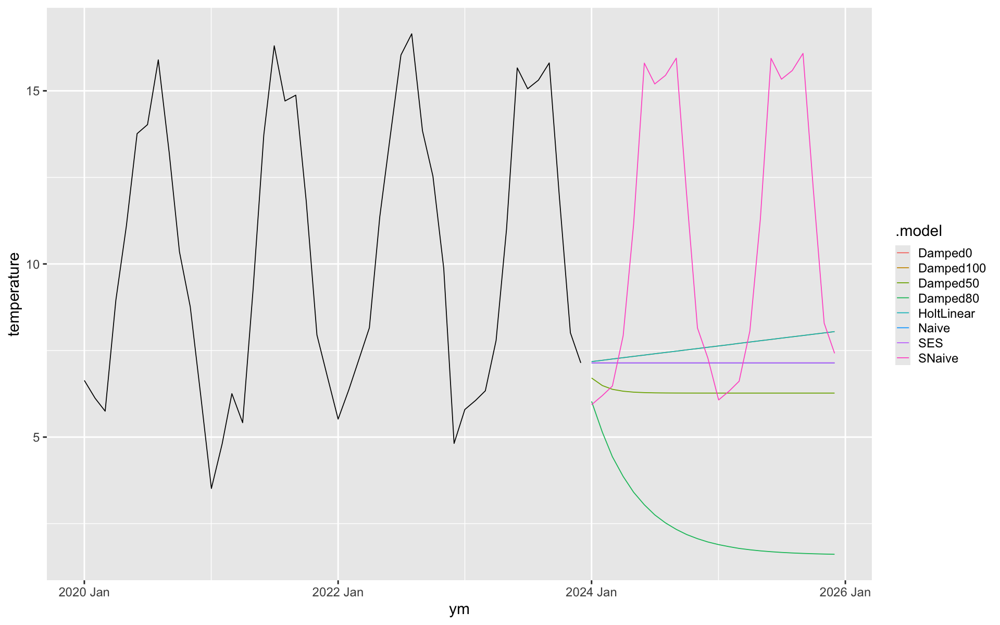

In [ ]:
addata_monthly |> 
  model(SNaive = SNAIVE(temperature ~ drift()),
        Naive = NAIVE(temperature),
        SES = ETS(temperature ~ error("A") + trend("N") + season("N")),
        HoltLinear = ETS(temperature ~ error("A") + trend("A") + season("N")),
        Damped50 = ETS(temperature ~ error("A") + trend("Ad", phi = 0.5) + season("N")),
        Damped80 = ETS(temperature ~ error("A") + trend("Ad", phi = 0.8) + season("N")),
        Damped0 = ETS(temperature ~ error("A") + trend("Ad", phi = 0) + season("N")), # Same as Naive
        Damped100 = ETS(temperature ~ error("A") + trend("Ad", phi = 1) + season("N")), # Same as HoltLinear
        ) |> forecast(h = 24) |> 
  autoplot(addata_monthly, level = NULL)

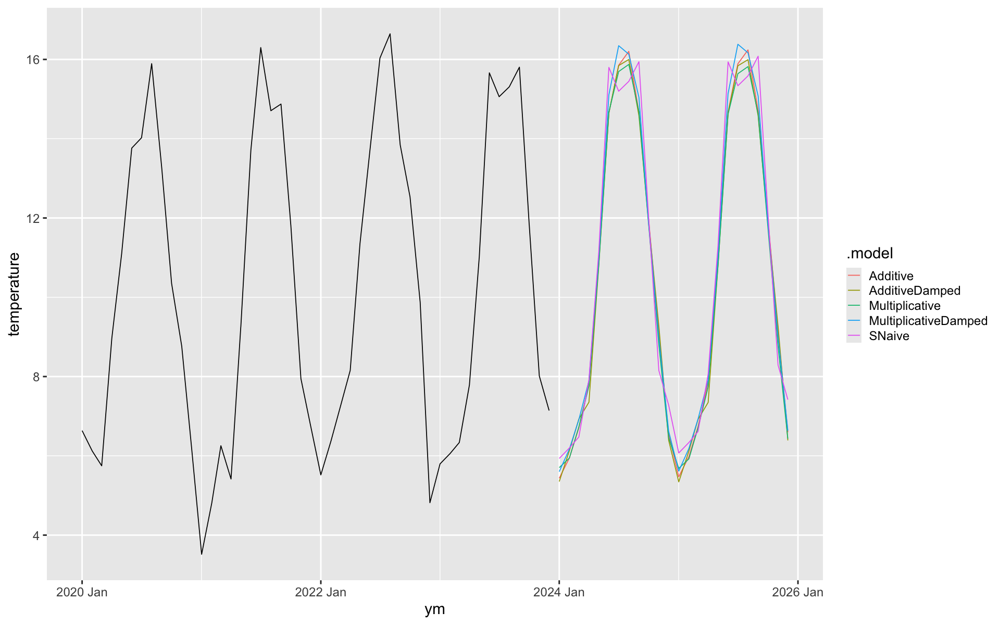

In [ ]:
addata_monthly |> 
  model(SNaive = SNAIVE(temperature ~ drift()), # Contains exactly the noise profile from the last period
        Additive = ETS(temperature ~ error("A") + trend("A") + season("A")),
        Multiplicative = ETS(temperature ~ error("M") + trend("A") + season("M")),
        AdditiveDamped = ETS(temperature ~ error("A") + trend("Ad") + season("A")),
        MultiplicativeDamped = ETS(temperature ~ error("M") + trend("Ad") + season("M"))
        ) |> forecast(h = 24) |> 
  autoplot(addata_monthly, level = NULL)

### A note on periodicity

ETS models as implemented in fable do not cope well with periods of more than 24 time steps. As such if you want to use them on data with periods longer than this you will need to reaggregate your data to a coarser time scale or move to the `forecast::stlf()` functions, however this is not covered in this tutorial.

### Another forecasting exercise

Try forecasting using some of these Exponential Smoothing models to the `aus_arrivals` dataset.

I've started you off here with a reminder that we need to filter a particular country to get just one time series:

In [ ]:
aus_arrivals |>
    filter(Origin == "Japan") |>
    ...

## Summary Statistics

Just like in non-time-series-world, it can be really nice to pick out some useful summary statistics to understand a time series from a quantitative perspective.

Luckily, the `feasts` package provides lots of functions and methods to retrieve such statistics.

### Basics

`features()` from `fabletools` is a function to allow one to compute arbitrary summary statistics from time series data.

Let's start by simply computing a few key features of the temperature data from earlier. We're going to use the original (non-aggregated) data for this.

In [ ]:
addata |> 
  features(temperature,
           features = list(mean = mean, variance = var, quantile = quantile))

mean,variance,quantile_0%,quantile_25%,quantile_50%,quantile_75%,quantile_100%
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
10.19121,20.30817,-2.425439,6.671144,10.11261,13.73158,24.84771


If we run this same command but on `aus_arrivals`, we get one line per sub-time-series.

In [ ]:
aus_arrivals |> 
  features(Arrivals,
           features = list(mean = mean, variance = var, quantile = quantile))

Origin,mean,variance,quantile_0%,quantile_25%,quantile_50%,quantile_75%,quantile_100%
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
Japan,122080.19,4123427340,9321,74134.5,135461,176752.5,227641
NZ,170585.83,7170720232,37039,96520.5,154537,228605.0,330812
UK,106857.46,4093754355,19886,53892.5,95564,128127.5,269292
US,84848.74,884962742,23721,63950.0,85878,108977.0,136094


### Autocovariance and Autocorrelation

Autocovariance (ACVF) is the variance between the present value and a previous value at lag $k$ in the time series, calculated across the time series.

Meanwhile autocorrelation (ACF) is the autocovariance at lag $k$ as a proportion of the total variance of the dataset, which can be calculated as the ACVF where $k = 0$.

We actually already calculated autocorrelation earlier using the `ACF()` function:

In [ ]:
dfibble |> ACF(sample_value, lag_max = 52)

lag,acf
<cf_lag>,<dbl>
1W,0.8646474
2W,0.7640465
3W,0.6737971
4W,0.5468455
5W,0.4419175
⋮,⋮
48W,0.4433745
49W,0.5246661
50W,0.6038654


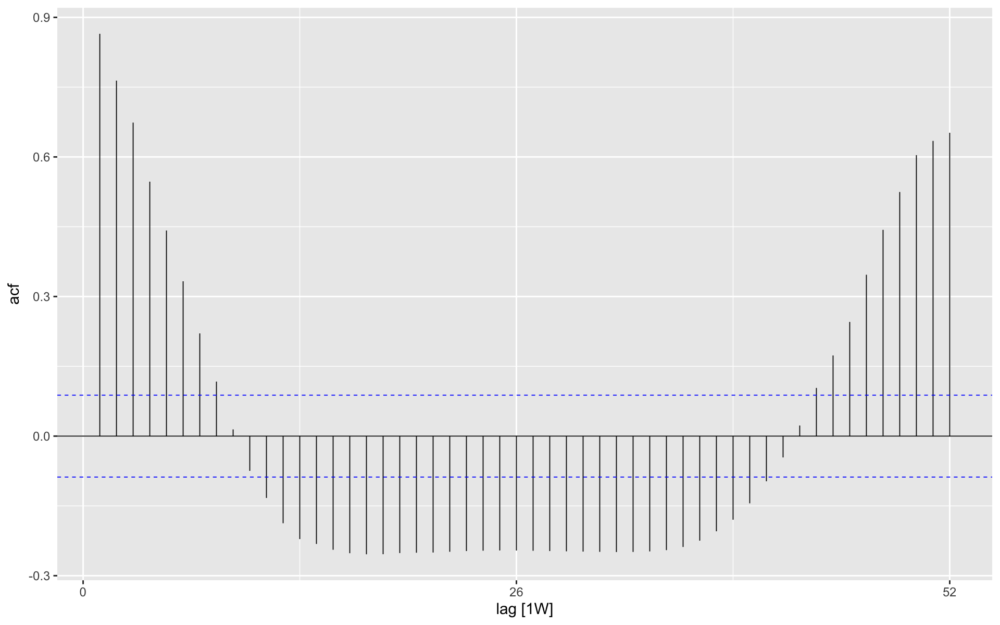

In [ ]:
dfibble |> ACF(sample_value, lag_max = 52) |> autoplot()

ACVF can be calculated using the same function, just with an extra argument:

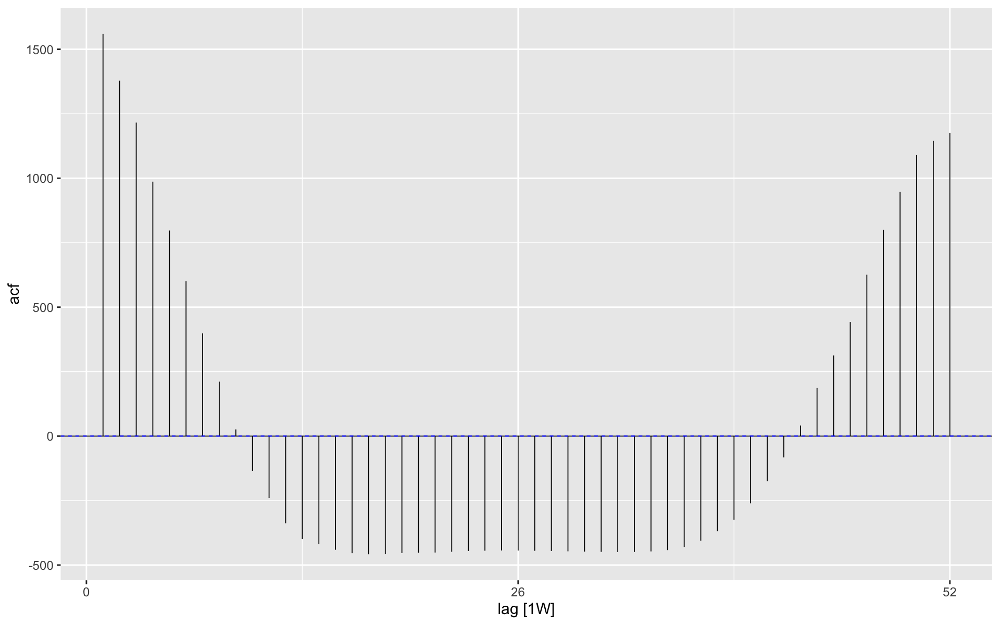

In [ ]:
dfibble |> ACF(sample_value, lag_max = 52, type = "covariance") |> autoplot()

You can see that the shape of the plot remains the same, though the units on the y axis are different. 

### Cross-correlation

Cross-correlation is closely related to autocorrelation, however instead of looking at within-time-series correlation, we look between two time series and various lag intervals.

As an example for this let's use a new dataset.

`pelt` is the lynx and hare fur trading records for the (recently defunct) Hudson Bay Company between 1845 and 1935.

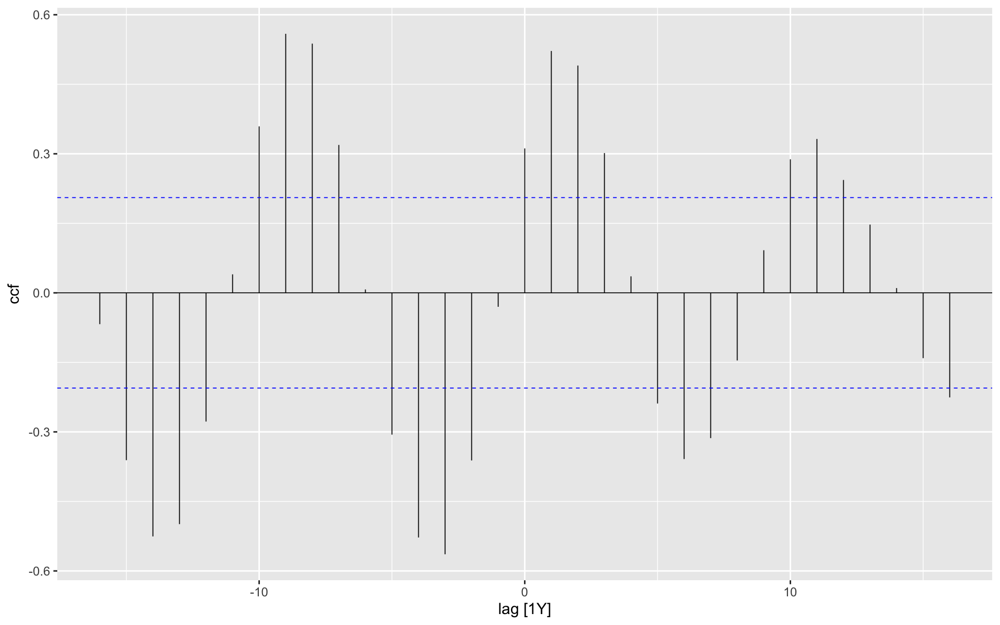

In [ ]:
pelt |> CCF(x = Lynx, y = Hare) |> autoplot()

This CCF plot is sinusoidal with the first peak at +1Y.

If we assume that animals are captured at a rate equal to their population size, then the fur trade rate is a proxy for the population of that animal.

This plot is thus showing that the lynx population is most strongly correlated with the hare population from the previous year.

[There _might_ be some classic research about such problems, but using ODEs.](https://en.wikipedia.org/wiki/Lotka%E2%80%93Volterra_equations)

### Decomposition statistics

We learnt earlier how to decompose time series into their component parts. We _were_ doing the evaluation visually to establish what the most important components were, however there are also statistical methods to do this using `feat_stl()`.

The _strength of trend_ ($F_t$) and _strength of seasonality_ ($F_s$) are two measures that determine the scale of effect of the trend/seasonality components with the remainder component.

If $F_t \approx 1$ then the scale of the trend is much greater than the scale of the remainder, indicating that the trend contributes a lot to the data. Conversely if $F_t \approx 0$ then the scale of the remainder is much larger than the scale of the trend.

The same is true for $F_s \approx 0$ and $F_s \approx 1$, but for seasonality.

Here's an example for the temperature data from AREAData.

In [ ]:
addata_monthly |>
  features(temperature, feat_stl)

trend_strength,seasonal_strength_year,seasonal_peak_year,seasonal_trough_year,spikiness,linearity,curvature,stl_e_acf1,stl_e_acf10
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
0.311238,0.9651362,8,1,0.0001611059,1.34826,0.8500155,-0.2656128,0.7222275


And another with the `aus_arrivals` dataset.

In [ ]:
aus_arrivals |> 
    features(Arrivals, feat_stl)

Origin,trend_strength,seasonal_strength_year,seasonal_peak_year,seasonal_trough_year,spikiness,linearity,curvature,stl_e_acf1,stl_e_acf10
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
Japan,0.9911384,0.8490948,1,2,654951181553,362049.5,-557064.92,-0.2862755,0.3486182
NZ,0.9950089,0.9519672,3,1,197493298617,881175.6,75837.03,-0.3653883,0.3927299
UK,0.9900745,0.9814662,0,2,185194378337,552140.9,-43793.71,-0.5335206,0.6558278
US,0.9799245,0.7485080,0,2,68689116838,300476.1,-54026.02,-0.3232904,0.6179408


We can see here that whilst all time series have a strong trend strength, NZ and the UK have a stronger seasonal strength.

This plays out in the seasonal plot below as well!

Plot variable not specified, automatically selected `y = Arrivals`


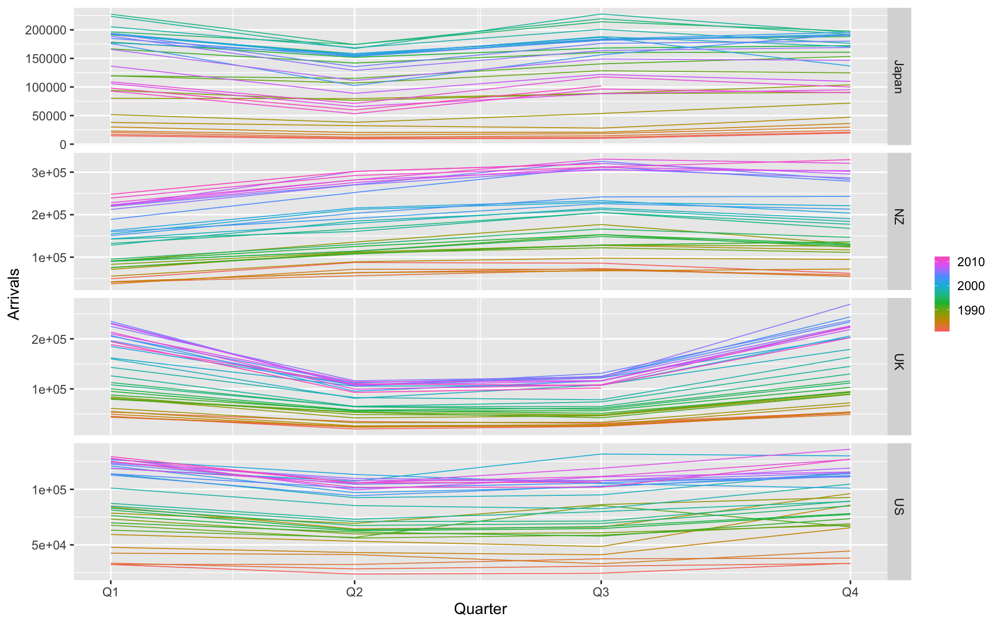

In [ ]:
aus_arrivals |> gg_season()

### Others

There are many other statistics that can be calculated for a time series.

For example here we generate more than 45 summary statistics for `aus_arrivals`:

In [ ]:
aus_arrivals |> 
    features(Arrivals, feature_set(pkgs = "feasts")) |> colnames()

[1] "Origin"                 "trend_strength"         "seasonal_strength_year"
 [4] "seasonal_peak_year"     "seasonal_trough_year"   "spikiness"             
 [7] "linearity"              "curvature"              "stl_e_acf1"            
[10] "stl_e_acf10"            "acf1"                   "acf10"                 
[13] "diff1_acf1"             "diff1_acf10"            "diff2_acf1"            
[16] "diff2_acf10"            "season_acf1"            "pacf5"                 
[19] "diff1_pacf5"            "diff2_pacf5"            "season_pacf"           
[22] "zero_run_mean"          "nonzero_squared_cv"     "zero_start_prop"       
[25] "zero_end_prop"          "lambda_guerrero"        "kpss_stat"             
[28] "kpss_pvalue"            "pp_stat"                "pp_pvalue"             
[31] "ndiffs"                 "nsdiffs"                "bp_stat"               
[34] "bp_pvalue"              "lb_stat"                "lb_pvalue"             
[37] "var_tiled_var"          "var_tiled_mean"         "shift_level_max"       
[40] "shift_level_index"      "shift_var_max"          "shift_var_index"       
[43] "shift_kl_max"           "shift_kl_index"         "spectral_entropy"      
[46] "n_crossing_points"      "longest_flat_spot"      "coef_hurst"            
[49] "stat_arch_lm"

Generally speaking, like with normal datasets, you will want to pick the summary statistics that accurately represent aspects of your time series that you care about.

## Autoregressive and ARIMA models

In `fable`, all types of autoregressive models are fit using the ARIMA command. This is because at a fundamental level, autoregressive models and moving average models are strict subsets of the general ARIMA model (which stands for _AutoRegressive Integrated Moving Average model_).

This is analagous to the similar concept that [nearly every frequentist statistical text can be a GLM](https://lindeloev.github.io/tests-as-linear/linear_tests_cheat_sheet.png).

Given this, it makes sense to explain each component of the ARIMA model and how they fit together.

### Autoregression (AR)

The Autoregressive term of an ARIMA model enables it to account for autocorrelation in the time series.

The formula for an AR model of order $p$ (aka AR(p)) is:

$$X_t = \alpha + \phi_1 X_{t-1} + \phi_2 X_{t-2} + \cdots + \phi_p X_{t-p} + W_t$$
Where $\alpha$ is the intercept term indicating drift, $\phi_n$ is the autoregressive coefficient at time $t-n$, $X_t$ is the value of the trend at time $t$, and $W_t$ is a white noise error term at time $t$.

AR models on their own are relatively powerful, however they essentially assume that the error term is completely independent. This is often not true however, which leads us to the next part.

### Moving Averages (MA)

The moving average (MA) element of an ARIMA model replaces the $W_t$ term above with another polynomial equation in the following form:

$$W_t + \theta_1 W_{t-1} + \theta_2 W_{t-2} + \cdots + \theta_q W_{t-q}$$
Where $\theta_t$ is a constant coefficient of the white noise at time $t$ and $W_t$ is the white noise at the same time.

This extra polynomial allows the error at time $t$ to be dependent on the error terms that came previously (i.e. there is now an effect of the trend on the error term).

When combined together, these two elements form something known as an ARMA model, with the full equation (for an ARMA(p,q) model) of:

$$X_t = \alpha + \phi_1 X_{t-1} + \phi_2 X_{t-2} + \cdots + \phi_p X_{t-p} + \mu +W_t + \theta_1 W_{t-1} + \theta_2 W_{t-2} + \cdots + \theta_q W_{t-q}$$

You do not _need_ to know this formula as such, only to be aware that this is how an ARMA model is defined.

ARMA models are generally very capable when a time series is _stationary_ (i.e. where the mean and variance do not change over time)
, however many time series are really not like this at all!

This is where the final part of the ARIMA puzzle comes in: _differencing_

### Differencing (I)

Differencing is the process of taking the difference between subsequent elements of a vector to produce a new vector of "changes".

So for a vector $\vec{V}$, the first order difference ($d=1$) is defined by $V_t' = V_t - V_{t - 1}$

And you can do this process again on the first order differences to get the second order difference vector.

The second order difference (the difference of differences, $d = 2$) is thus found by $V^*_t = V_t' - V_{t - 1}'$

As an example:

In [ ]:
v <- (1:5)^2 + (1:5)  # y = x^2 + x + 0
print(v)              # Original vector
print(diff(v))        # First order difference
print(diff(diff(v)))  # Second order difference

[1]  2  6 12 20 30
[1]  4  6  8 10
[1] 2 2 2


You can see here how whilst the vector on its own changes over time, the second order difference stays at a constant value and variance.

We've converted this non-stationary process into a stationary representation! This will behave nicely with the ARMA model we created above.

#### Seasonal Differencing

Another type of differencing that is important within ARIMA modelling is called _seasonal differencing_.

Instead of differencing with the previous neighbor in the time series, seasonal differencing attempts to address a lack of _seasonal stationarity_ (i.e. the seasonal component of a time series varies in mean or variance over time).

If a time series of period $m$ is seasonally stationary, the following will be true:

$$V_t = V_{t-m}$$

Seasonal differencing takes values at the same relative position within adjacent seasonal periods and finds the difference between them:

$$V_t' = V_t - V_{t-m}$$

You can of course do higher order differencing in a seasonal manner too:

$$V^*_t = V_t' - V_{t-m}'$$

When using an ARIMA model, the fitting of the ARMA model is performed on the differenced values of the time series rather than the time series itself. Forecasting then explodes back out this second order model back to the scale of the original data.

### Notation

When put all together, an ARIMA model is typically written in the following form:

$$\text{ARIMA}(p,d,q)$$
Where $p$ is the order of the autoregressive polynomial (i.e. the number of lag terms), $d$ is the order of differencing, and $q$ is the order of the moving average polynomial.

As a very simple example, an ARIMA(1,0,0) model is functionally exactly the same as an AR(1) model, which would be formulated as:

$$X_t = \alpha + \phi_1 X_{t-1} + W_t$$
Meanwhile an ARIMA(2,0,1) model would be:

$$X_t = \alpha + \phi_1 X_{t-1} + \phi_2 X_{t-2} + \mu + W_t + \theta_1 W_{t-1}$$

## SARIMA models

ARIMA models can be extended further to account for a seasonal component. This creates a Seasonal ARIMA (or SARIMA) model.

In effect this adds two extra polynomial terms, one for the autoregressive element of the seasonal signal, and one moving average for effect of seasonality on the error term.

The parameterisation is possibly a little too much for this brief time (phew!) but it does follow a similar structure to the ARMA model above with extra terms, called (P,D,Q). These are exactly the same as (p,d,q) in the ARIMA model, but parameterising the seasonal effects instead (with $D$ controlling the order of _seasonal_ differencing.

As such a SARIMA model is usually written:

$$\text{ARIMA}(p,d,q)(P,D,Q)_m$$
where $m$ is the period of the seasonality.

Now, before we start actually fitting ARIMA models, there is one more step that's worth talking about.

## Testing for stationarity

Sometimes differencing when it is not required can cause problems, as such it is worthwhile knowing at least how to quickly test for the order of differencing required for generating a stationary series.

We can do this by performing a KPSS test (which tests for stationarity) alongside two tests for something called "unit roots" (which allows us to calculate the number of differences required for stationarity).

Luckily `feasts` makes this super easy. Let's look at the `aus_lifestock` dataset as a quick example.

This dataset is a quarterly time series dataset recording the number of each type of livestock animal in Australia, stratified by state. 

Here, we focus on the time series measuring the number of calves and have computed the KPSS test statistic and p-value. `unitroot_ndiffs` calculates the appropriate number of differences based on this value, while unitroot_nsdiffs calculates the appropriate number of _seasonal_ differences based on the seasonal strength of an STL decomposition.

In [ ]:
aus_livestock |>
    filter(Animal == "Calves") |>
    features(Count, c(unitroot_kpss, unitroot_ndiffs, unitroot_nsdiffs))

Animal,State,kpss_stat,kpss_pvalue,ndiffs,nsdiffs
<fct>,<fct>,<dbl>,<dbl>,<int>,<int>
Calves,Australian Capital Territory,3.6182325,0.01,1,0
Calves,New South Wales,3.0957579,0.01,1,0
Calves,Northern Territory,2.2056502,0.01,1,0
Calves,Queensland,5.7474784,0.01,1,0
Calves,South Australia,6.0752417,0.01,1,0
Calves,Tasmania,0.0889697,0.10,0,1
Calves,Victoria,2.0403177,0.01,1,1
Calves,Western Australia,4.2110969,0.01,1,0


The KPSS test has stationarity as a null assumption. The p value is just like any other statistical test, `p < 0.05` is considered to be significant and thus a rejection of the null (i.e. we should assume nonstationarity).

We can see here that Tasmania seems to have a stationary level but nonstationary seasonality (kpss p > 0.05, nsdiffs > 0). Meanwhile Queensland has a nonstationary level but with stationary seasonality (ndiffs > 0, nsdiffs = 0). Finally Victoria has both non-stationary seasonality and a non-stationary level (ndiffs > 0, nsdiffs > 0). Let's check this by plotting part of the dataset:

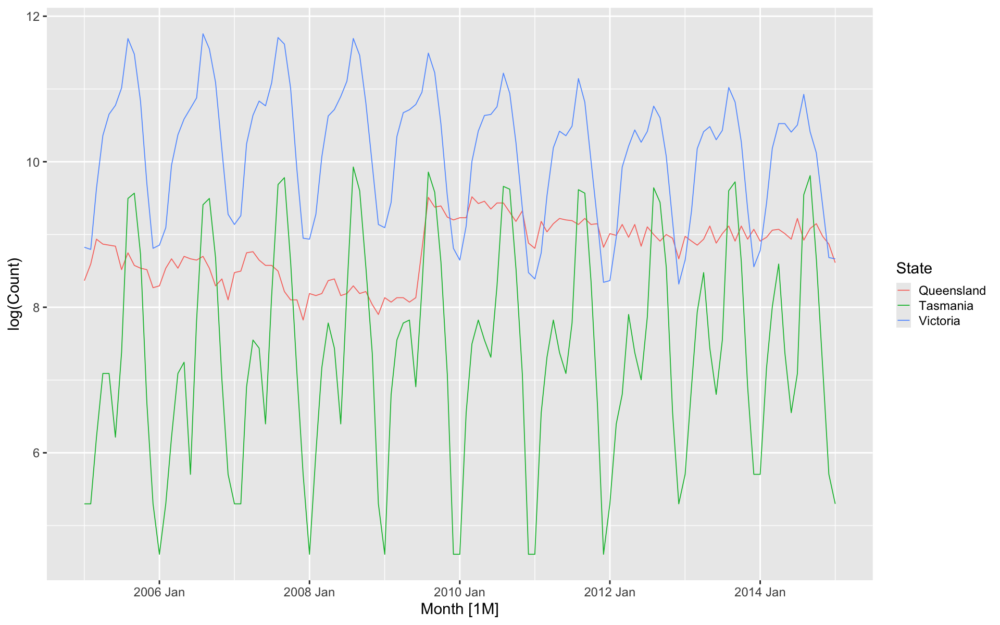

In [ ]:
aus_livestock |>
    filter(Animal == "Calves", State %in% c("Victoria", "Tasmania", "Queensland")) |>
    filter_index("2005 Jan" ~ "2015 Jan") |>
    select(Month, State, Count) |>
    autoplot(log(Count))

This suggests some appropriate values of $d$ and $D$ when modelling these time series using a SARIMA model.

## Fitting (S)ARIMA models

The act of actually fitting an ARIMA model involves (your computer) trying to set values for the parameters in your model such that the model outputs best fit the data you have provided, just like any other model fitting.

So for an ARIMA(2,0,1) model:
$$X_t = \alpha + \phi_1 X_{t-1} + \phi_2 X_{t-2} + \mu + W_t + \theta_1 W_{t-1}$$
the fit parameters would be $\alpha$, $\mu$, $\phi_1$, $\phi_2$ and $\theta_1$.

R does this automatically (using maximum likelihood fitting by default). 

It also tries to work out the best values for (p,d,q)(P,D,Q) if they are not specified by the user!

So you actually don't _need_ to tell it much about the model you want at all, it can usually work it out. However if you can specify some of these "hyperparameters" before it starts, it will have a much easier (and quicker) time fitting!

## Fitting (S)ARIMA models using `fable`

`fable` provides an _exceptionally_ easy interface for fitting ARIMA-style models to data: the `ARIMA()` command.

More explicitly, an ARIMA model is specified as follows:

```
ARIMA(X ~ pdq(p, d, q) + PDQ(P, D, Q, period = m) + k)
```

The arguments here have the following meanings:

- `X`: column name of the time series being modeled
- `p`: the non-seasonal autoregressive order
- `q`: the non-seasonal moving average order
- `d`: the order of non-seasonal differencing
- `P`: the seasonal autoregressive order
- `Q`: the seasonal moving average order
- `D`: the order of seasonal differencing
- `m`: the period of the seasonality
- `k`: 1 if a mean (drift) parameter is to be fit, otherwise 0

If any of these hyperparameters is not specified, it will be automatically estimated from the data.

You can also provide ranges of values for the fitter to attempt (rather than allowing it to try everything). So `pdq(0:2, 1, 2)` would tell the ARIMA model that $d=1$ and $q=2$, but $p$ can be 0, 1, or 2.

Importantly, if the `PDQ()` element of the model is not specified, _`fable` assumes that it should exist, and so tries to estimate it!!!_

If you wish to specify a non-seasonal ARIMA, you must specify a term `PDQ(0, 0, 0)`. Simply omitting the PDQ element of the formula is not enough.

### Fitting time!

Let's do a simple fit of an ARIMA model to some data, specifically the monthly AREAdata temperatures from earlier!

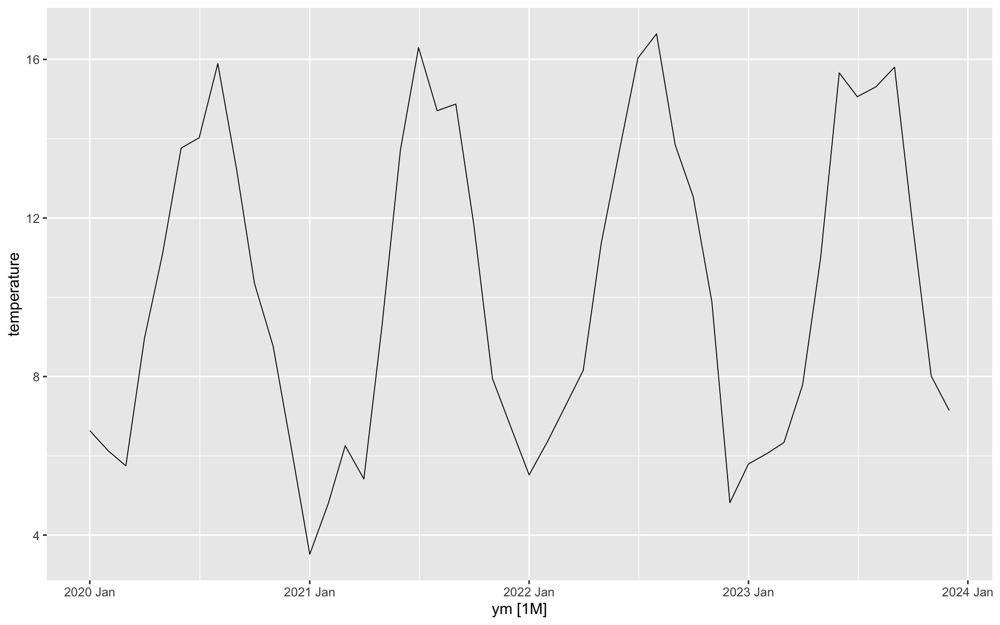

In [ ]:
addata_monthly |> autoplot(.vars = temperature)

First let's check the stationarity of the data:

In [ ]:
addata_monthly |> features(temperature, c(unitroot_kpss, unitroot_ndiffs, unitroot_nsdiffs))

kpss_stat,kpss_pvalue,ndiffs,nsdiffs
<dbl>,<dbl>,<int>,<int>
0.06868486,0.1,0,1


Straight away here it looks like the overall trend might not be stationary, which makes sense if the seasonal component here is huge (which it is). We also see that 1 seasonal difference is generally a good call here.

Now let's just let ARIMA decide what parameters to use. This will take a bit of time because it actually needs to fit a bunch of models before deciding which is the best.

In [ ]:
addata_arimafit <- addata_monthly |> model(arima=ARIMA(temperature)) 
addata_arimafit

arima
<model>
"<ARIMA(0,0,0)(1,1,0)[12] w/ drift>"


So `<ARIMA(0,0,0)(1,1,0)[12] w/ drift>` is saying that the best fit it found was a model with no major trend components (p,d,q), but with seasonal PDQ parameters of 1,1,0 (i.e. there is a 1-period component to the trend of the first order differences in seasonality). It also decided that drift was useful here.

Let's have a look to see what that fit looks like by forecasting ahead

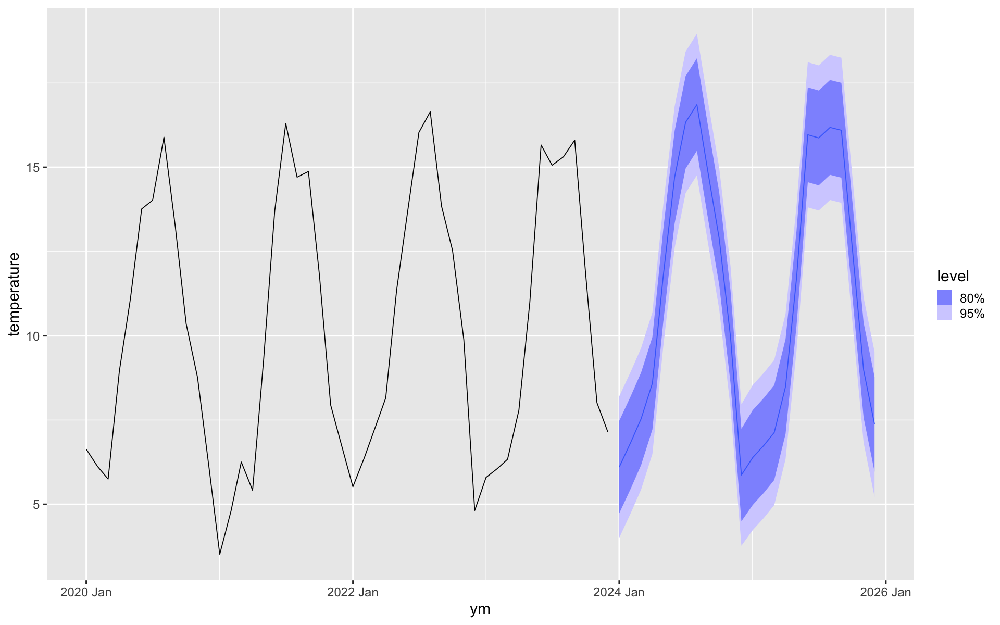

In [ ]:
addata_arimafit |> forecast(h = 24) |> autoplot(addata_monthly)

Yeah, that looks like a pretty accurate model indeed!

Let's explicitly fit this same model and see what that looks like:

In [ ]:
addata_arimafit <- addata_monthly |> model(arima=ARIMA(temperature ~ pdq(0,0,0) + PDQ(1,1,0, period=12) + 1))
addata_arimafit

arima
<model>
"<ARIMA(0,0,0)(1,1,0)[12] w/ drift>"


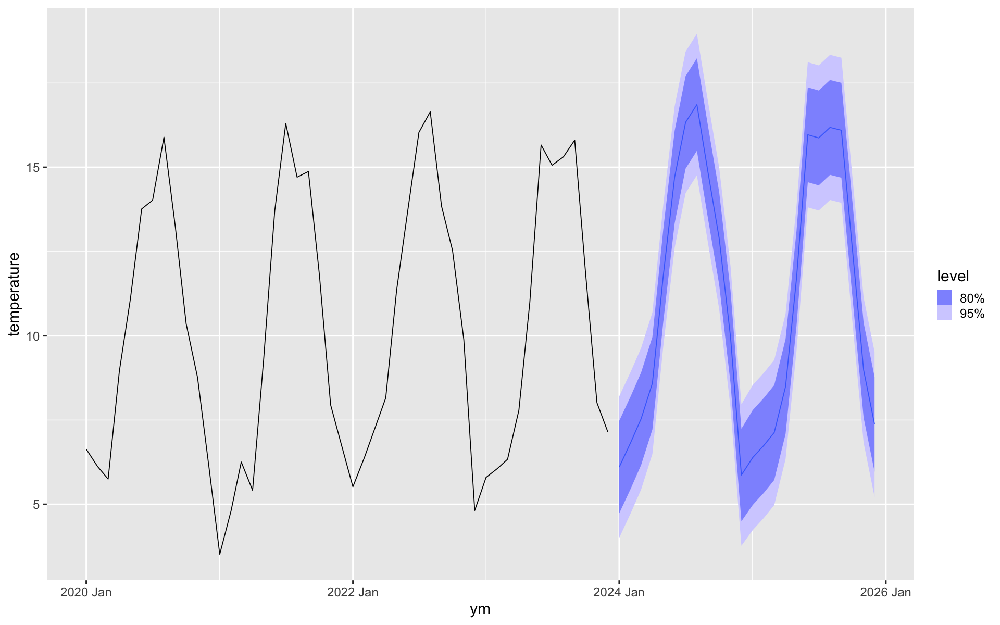

In [ ]:
addata_arimafit |> forecast(h = 24) |> autoplot(addata_monthly)

Amazing, now let's fit a few models to the `vecdyn` data we retrieved before.

In [ ]:
dfibble |> features(sample_value, c(unitroot_kpss, unitroot_ndiffs, unitroot_nsdiffs))

kpss_stat,kpss_pvalue,ndiffs,nsdiffs
<dbl>,<dbl>,<int>,<int>
0.1415662,0.1,0,1


In [ ]:
dfibble_arimafit <- dfibble |> model(
  search=ARIMA(sample_value),
  moreAR=ARIMA(sample_value ~ pdq(2,0,0) + PDQ(1,1,0)),
  moreMA=ARIMA(sample_value ~ pdq(1,0,1) + PDQ(1,1,0)),
  moreSAR=ARIMA(sample_value ~ pdq(1,0,0) + PDQ(2,1,0) + 0),
  moreSMA=ARIMA(sample_value ~ pdq(1,0,0) + PDQ(1,1,1) + 0),
  silly=ARIMA(sample_value ~ pdq(2,1,1) + PDQ(1,1,0) + 0)
  ) 

dfibble_arimafit

search,moreAR,moreMA,moreSAR,moreSMA,silly
<model>,<model>,<model>,<model>,<model>,<model>
"<ARIMA(1,0,0)(1,1,0)[52]>","<ARIMA(2,0,0)(1,1,0)[52]>","<ARIMA(1,0,1)(1,1,0)[52]>","<ARIMA(1,0,0)(2,1,0)[52]>","<ARIMA(1,0,0)(1,1,1)[52]>","<ARIMA(2,1,1)(1,1,0)[52]>"


In [ ]:
dfibble_arimafit |> tidy()

In [ ]:
dfibble_arimafit |> tidy()

.model,term,estimate,std.error,statistic,p.value
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>
search,ar1,0.613382266,0.03765503,16.2895154,4.150617e-47
search,sar1,-0.385064961,0.04477982,-8.5990742,1.390762e-16
moreAR,ar1,0.609294563,0.04770281,12.7727172,4.889723e-32
moreAR,ar2,0.006607616,0.04737006,0.1394893,8.891268e-01
moreAR,sar1,-0.385210177,0.04478403,-8.6015072,1.365717e-16
⋮,⋮,⋮,⋮,⋮,⋮
moreSMA,sma1,-0.749868040,0.085181644,-8.8031647,2.991816e-17
silly,ar1,0.608533569,0.047945291,12.6922489,1.063571e-31
silly,ar2,0.005824165,0.047595380,0.1223683,9.026628e-01


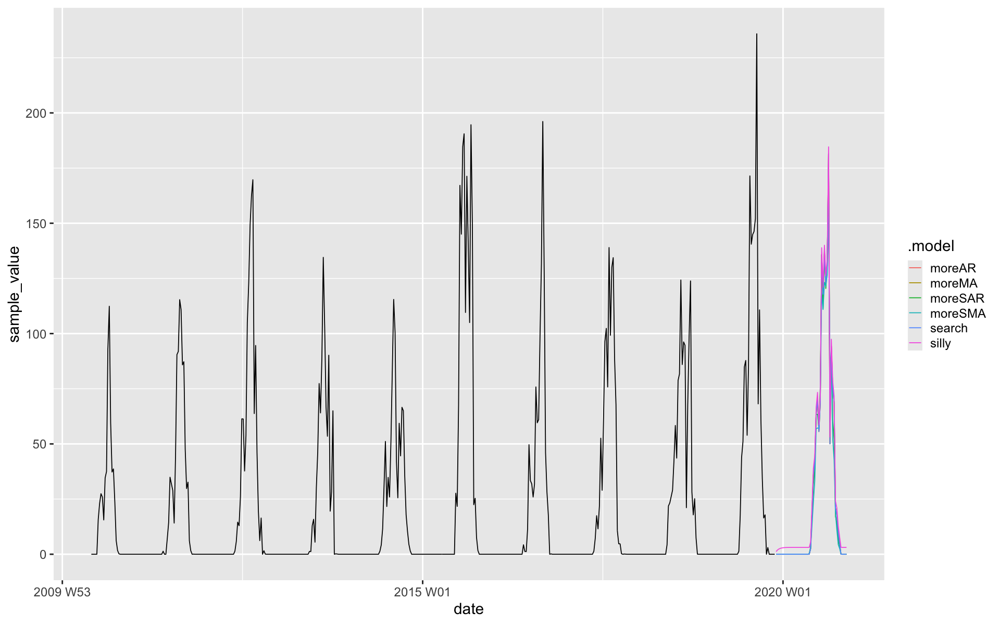

In [ ]:
dfibble_arimafit |> forecast(h = 52) |> autoplot(dfibble, level = NULL)

We can also inspect the AICc values (indicating which model fits the best) of our models using the `glance()` command, to determine generally the best model for the job.

In [ ]:
dfibble_arimafit |> 
  glance() |>
  select(.model, AICc)  # Only required when working in a jupyter notebook

.model,AICc
<chr>,<dbl>
search,3992.580
moreAR,3994.597
moreMA,3994.591
moreSAR,3977.231
moreSMA,3957.774
silly,3992.145


Generally with AIC, a model that has an AIC score 2 below another is considered to be a better model for the data at hand. So here, `search` (the `ARIMA(1,0,0)(1,1,0)` model) is the best with an AICc of >2 below the second best (`moreMA`).

**Note:** You cannot use AICc to compare models that have different orders of differencing, or when one model has been transformed.

You also cannot use AIC to compare models that are fit to different data.

### Helpful equivalents

Many simple formulations of ARIMA models are equivalent to other basic models, for a few examples:

- `ARIMA(0,0,0)` is a white noise model
- `ARIMA(0,1,0)` is a random walk
- `ARIMA(0,1,2)` is a Damped Holt's model
- `ARIMA(0,1,1)` with a $\mu$ constant of 0 is a simple exponential smoothing (SES) model
- `ARIMA(0,1,1)` with a nonzero $\mu$ constant is an SES with growth
- `ARIMA(0,2,2)` is a Holt's linear method with additive errors

### Final exercise

Try pulling dataset **575** from `vecdyn`.

Make it a tsibble, fix it up, plot it, decompose it, fit some models to it (including at least 1 ARIMA model) and check which of your models fits the best!

## Predictive covariates

Throughout this entire tutorial so far, we have only been dealing with modelling a time series by itself with no other factors.

This is the preferred approach simply because without a good understanding of time series modelling, managing any other potential variables is essentially untenable.

However, now we have developed that understanding, we're good to go!

Let's take a time series containing two sub-series, the `us_change` dataset.

This contains quarterly data about the percentage changes in personal consumption expenditure, personal disposable income, production, savings and the unemployment rate for the US between 1970 and 2016.

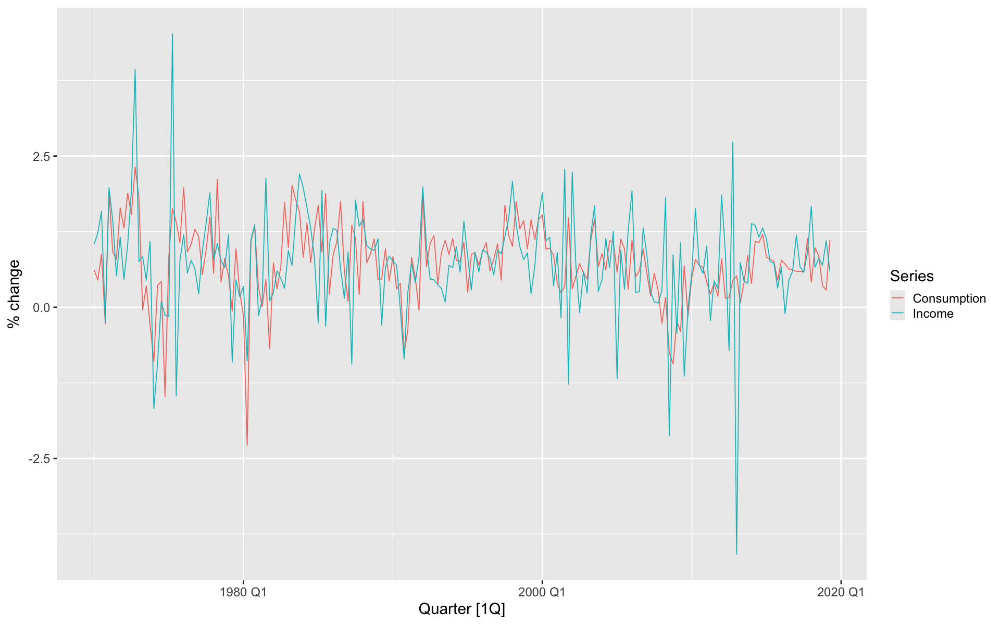

In [ ]:
us_change |>
  pivot_longer(c(Consumption, Income), names_to="Series") |>
  autoplot(value) +
  labs(y = "% change")

`geom_smooth()` using formula = 'y ~ x'


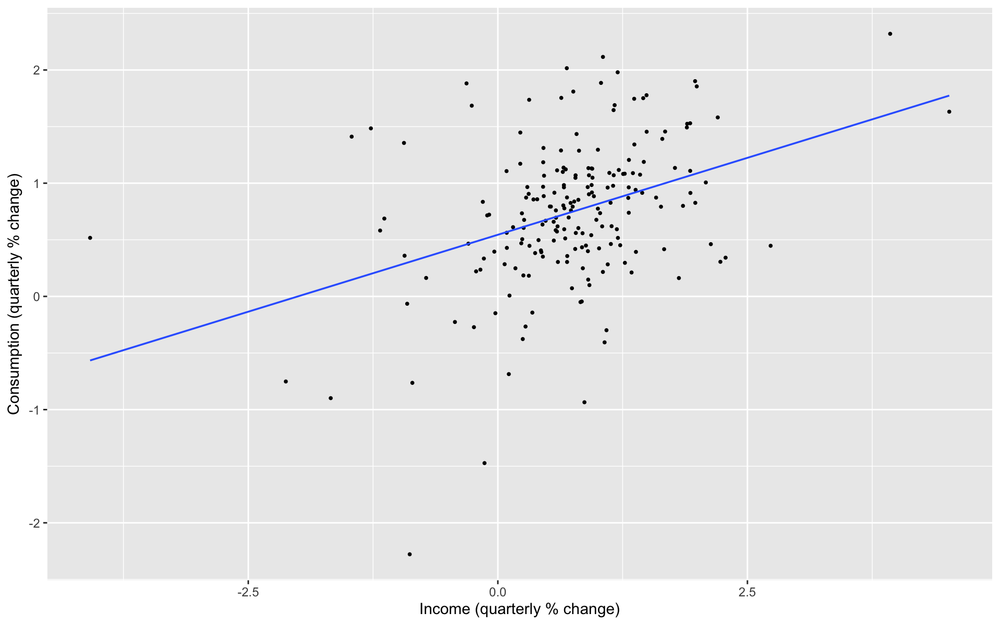

In [ ]:
us_change |>
  ggplot(aes(x = Income, y = Consumption)) +
  labs(y = "Consumption (quarterly % change)",
       x = "Income (quarterly % change)") +
  geom_point() +
  geom_smooth(method = "lm", se = FALSE)

From the above plots we can see that there is some sort of predicative relationship between Income ($X_t$) and Consumption ($Y_t$).

Let's model this using a time series linear model (TSLM). This model is very similar to a typical linear model, but specifically for time series.

It has the general form (for one predictor) of:

$$Y_t = \alpha + \beta X_t + W_t$$
where $\alpha$ and $\beta$ are coefficients to fit, $X_t$ is a predictor time series, and $W_t$ is a white noise function.

To fit a TSLM we (appropriately) use the `TSLM()` function from `fable`:

In [ ]:
lr_fit <- us_change |>
  model(TSLM(Consumption ~ Income))
lr_fit |> report()

Series: Consumption 
Model: TSLM 

Residuals:
     Min       1Q   Median       3Q      Max 
-2.58236 -0.27777  0.01862  0.32330  1.42229 

Coefficients:
            Estimate Std. Error t value Pr(>|t|)    
(Intercept)  0.54454    0.05403  10.079  < 2e-16 ***
Income       0.27183    0.04673   5.817  2.4e-08 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 0.5905 on 196 degrees of freedom
Multiple R-squared: 0.1472,	Adjusted R-squared: 0.1429
F-statistic: 33.84 on 1 and 196 DF, p-value: 2.4022e-08


For this simple time series, we can see that the intercept term $\alpha \approx 0.54$ and the income coefficient $\beta \approx 0.27$. This means that for an increase of 1% in income, a 0.27% increase in consumption is observed. In the absence of any change in income, there is an increase of 0.54%.

However if we plot the residuals we can see an issue in the bottom right pane:

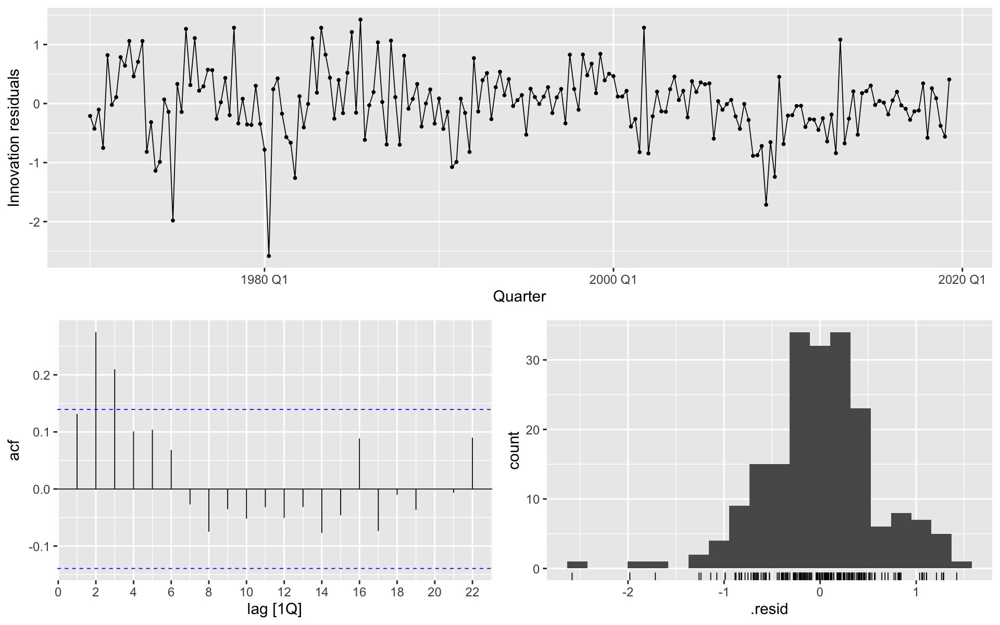

In [ ]:
lr_fit |> gg_tsresiduals()

Here the residuals are significantly skewed (we expect them to be relatively normally-distributed).

Maybe we should include some more predictors to see if that accounts for this relationship. This is called "multiple time series linear regression" but is also fit with `TSLM()`

In [ ]:
mlr_fit <- us_change |>
  model(TSLM(Consumption ~ Income + Production + Savings + Unemployment))
mlr_fit |> report()

Series: Consumption 
Model: TSLM 

Residuals:
     Min       1Q   Median       3Q      Max 
-0.90555 -0.15821 -0.03608  0.13618  1.15471 

Coefficients:
              Estimate Std. Error t value Pr(>|t|)    
(Intercept)   0.253105   0.034470   7.343 5.71e-12 ***
Income        0.740583   0.040115  18.461  < 2e-16 ***
Production    0.047173   0.023142   2.038   0.0429 *  
Savings      -0.052890   0.002924 -18.088  < 2e-16 ***
Unemployment -0.174685   0.095511  -1.829   0.0689 .  
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 0.3102 on 193 degrees of freedom
Multiple R-squared: 0.7683,	Adjusted R-squared: 0.7635
F-statistic:   160 on 4 and 193 DF, p-value: < 2.22e-16


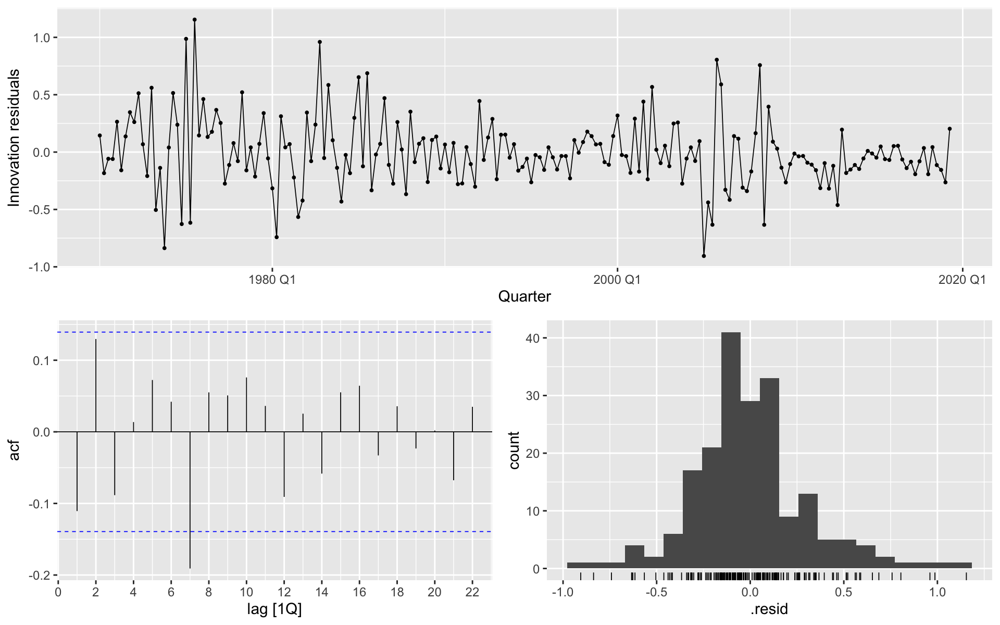

In [ ]:
mlr_fit |> gg_tsresiduals()

Better for sure! However there's a big issue here, if tried to forecast using this method we would immediately hit a snag!

We do not have any _future_ values of Income, Production, Savings, or Unemployment that could be used to generate future values.

Also if any of the effects of these predictors have lag components, we can't model those either!

We could resolve some of this by forecasting the predictors themselves, or by using "deterministic predictors" however this is outside the scope of this tutorial. Instead let's look at forms of multivariate models that can handle lags.

### Dynamic regression

A dynamic regression allows us to specify lagged variants of a predictor time series using the `lag()` command:

In [ ]:
consumption_fit <- us_change |>
  model(dr1 = ARIMA(Consumption ~ Income),
        dr2 = ARIMA(Consumption ~ Income + lag(Income, 1)))
consumption_fit |> select(dr1) |> report()

Series: Consumption 
Model: LM w/ ARIMA(1,0,2) errors 

Coefficients:
         ar1      ma1     ma2  Income  intercept
      0.7070  -0.6172  0.2066  0.1976     0.5949
s.e.  0.1068   0.1218  0.0741  0.0462     0.0850

sigma^2 estimated as 0.3113:  log likelihood=-163.04
AIC=338.07   AICc=338.51   BIC=357.8


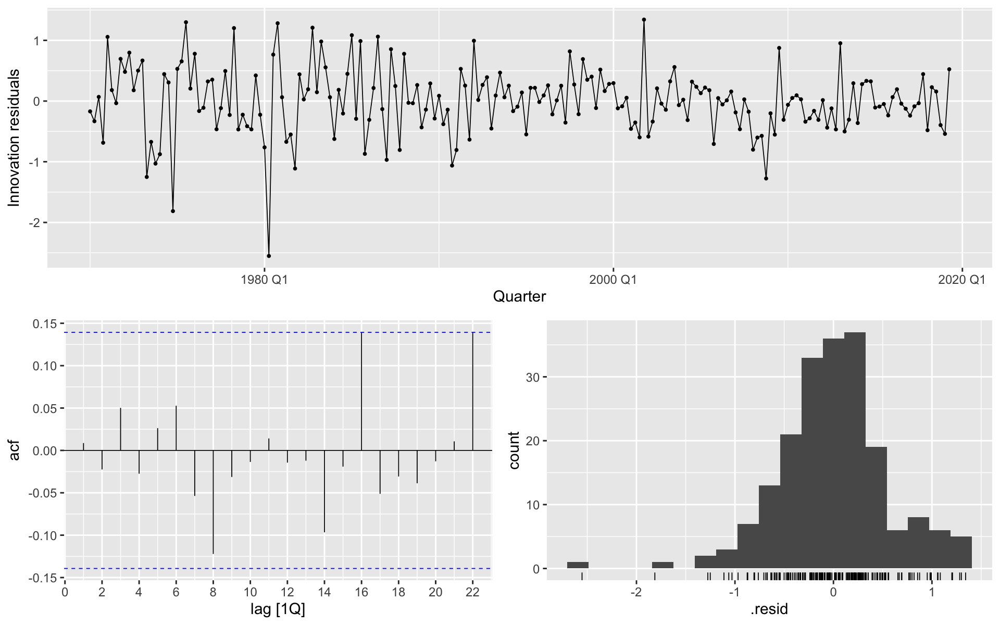

In [ ]:
consumption_fit |> select(dr1) |> gg_tsresiduals()

Those residuals look a _lot_ more normal. It looks like the ARIMA model here is doing its job.

The ARIMA terms are still automatically estimated by the `ARIMA()` function! That said, it cannot automatically estimate the form or lags of the other predictor variables.

Let's extend this model above to use multiple predictors (though notice we _must_ provide these predictors and their lags explicitly)

In [ ]:
consumption_fit <- us_change |>
  model(dr1 = ARIMA(Consumption ~ Income + lag(Income, 1)),
        dr2 = ARIMA(Consumption ~ Income + lag(Income, 1) + Production + 
                    lag(Production, 1)),
        dr3 = ARIMA(Consumption ~ Income + lag(Income, 1) + Production + 
                    lag(Production, 1) + Unemployment + lag(Unemployment, 1)),
        dr4 = ARIMA(Consumption ~ Income + lag(Income, 1) + Production + 
                    lag(Production, 1) + Unemployment + lag(Unemployment, 1) + 
                    Savings + lag(Savings, 1)),
        dr5 = ARIMA(Consumption ~ Income + lag(Income, 1) + Production + 
                    lag(Production, 1) + Unemployment + lag(Unemployment, 1) + 
                    Savings + lag(Savings, 1) + lag(Income, 2) + lag(Production, 2) + 
                    lag(Unemployment, 2) + lag(Savings, 2)))
consumption_fit |> glance() |> select(.model, AICc)

.model,AICc
<chr>,<dbl>
dr1,327.7395
dr2,287.3911
dr3,278.1080
dr4,119.3768
dr5,114.9476


Surprisingly, the model that has the smallest AICc value is the most complicated model, which includes the current value and the first two lags of all the possible predictor time series. A residual analysis seems to suggest that the model is a good fit.

Warning message:
“Removed 2 rows containing missing values or values outside the scale range
(`geom_line()`).”
Warning message:
“Removed 2 rows containing missing values or values outside the scale range
(`geom_point()`).”
Warning message:
“Removed 2 rows containing non-finite outside the scale range (`stat_bin()`).”


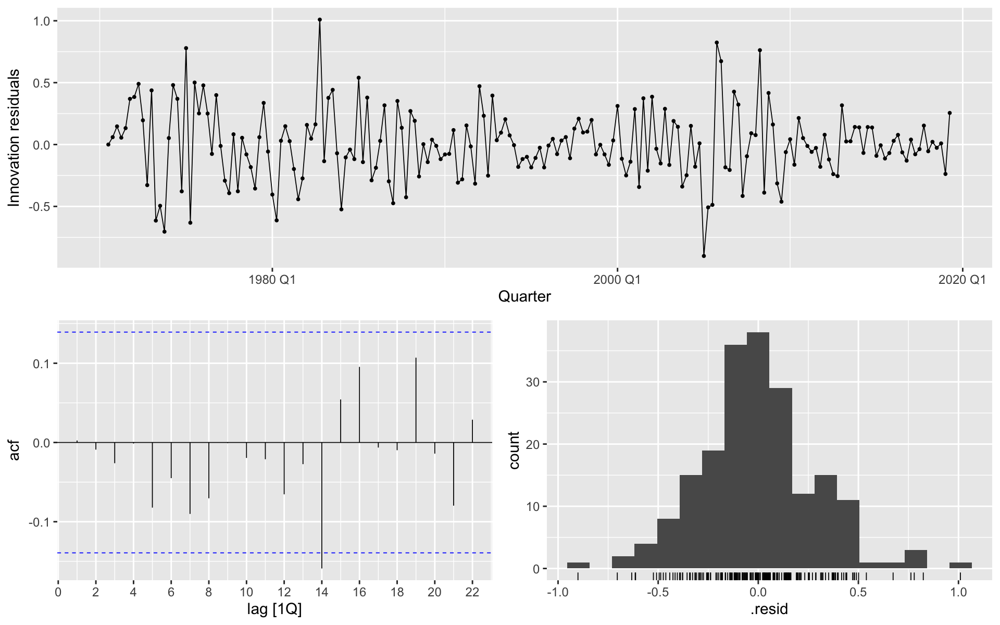

In [ ]:
consumption_fit |> select(dr5) |> gg_tsresiduals()

## Time Series Checklist

Finally in this tutorial, here is a quick thing that you can refer back to when analysing your own time series.

> So you've ended up with some time series data to analyse.

Here is a really simple checklist for some things to do:

1. Load your data
2. Try to convert to a `tsibble`
3. Fix gaps if possible by aggregation or simple impution
4. Reaggregate if the data is too fine-scaled
5. Plot plot plot!
    - The time series
    - Seasonality plot
    - Lag plots
    - ACF plots
6. Decompose (either STL or classical)
7. Get summary statistics
8. Model & forecast
9. Select best model (if desired)

## Sources

This entire workshop is based on the fantastic course [Introduction to Time Series Analysis](https://yanshuo.quarto.pub/nus-ts-book/) by Yanshuo Tan and Vik Gopal.

That course is absolutely stuffed with the details of _how_ these statistics work. If you want to know more about why we can just _do_ these things, or if some parts of this workshop seemed a bit arcane, it may well be worthwhile checking out the source material. You'll certainly recognise some of the datasets!